# Subclustering of mesoderm in Integration data

In [1]:
# loading packages
library(Seurat)
library(ggplot2)
library(magrittr)
library(data.table)
library(Matrix)
library(dplyr)
library(tibble)
library(harmony) # for integration


Attaching package: ‘dplyr’


The following objects are masked from ‘package:data.table’:

    between, first, last


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Loading required package: Rcpp



In [2]:
sessionInfo()

R version 4.0.3 (2020-10-10)
Platform: x86_64-apple-darwin17.0 (64-bit)
Running under: macOS Catalina 10.15.7

Matrix products: default
BLAS:   /Library/Frameworks/R.framework/Versions/4.0/Resources/lib/libRblas.dylib
LAPACK: /Library/Frameworks/R.framework/Versions/4.0/Resources/lib/libRlapack.dylib

locale:
[1] ja_JP.UTF-8/ja_JP.UTF-8/ja_JP.UTF-8/C/ja_JP.UTF-8/ja_JP.UTF-8

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

other attached packages:
[1] harmony_0.1.0     Rcpp_1.0.7        tibble_3.0.5      dplyr_1.0.3      
[5] Matrix_1.3-2      data.table_1.13.6 magrittr_2.0.1    ggplot2_3.3.3    
[9] Seurat_3.2.3     

loaded via a namespace (and not attached):
 [1] nlme_3.1-151          matrixStats_0.57.0    RcppAnnoy_0.0.18     
 [4] RColorBrewer_1.1-2    httr_1.4.2            repr_1.1.0           
 [7] sctransform_0.3.2     tools_4.0.3           R6_2.5.1             
[10] irlba_2.3.3           rpart_4.1-15          KernSmooth_2.23-18

In [3]:
func.centering <- function(seu){
    DefaultAssay(seu) <- 'SCT'
    scale.data <- GetAssayData(seu, assay = 'SCT', slot = 'scale.data') #Get scale.data
    new.data <- ScaleData(object = scale.data, do.scale = F, do.center = T) #centering scale.data
    
    seu <- SetAssayData(object = seu, assay = 'SCT',
                        slot = 'scale.data', new.data = new.data) #insert centering data into scale.data slot
    return(seu)
    
}

func.normalize <- function(seu){
    
    if(dim(seu)[2]>=500){
        #Re-Normalize data only when the number of cell in the target clusters > 500.
        DefaultAssay(seu) <- 'RNA'
        if(seu$set[1]=='Set 1'){
            vars.to.regress <- c("percent.mt", "percent.rRNA","percent.ERCC")
        }else{
            vars.to.regress <- c("percent.mt", "percent.rRNA")
        }
        seu <- suppressWarnings(SCTransform(seu, vars.to.regress = vars.to.regress))
    }else{
        #If The number of cells < 500, re-normalization is skipped and only centering is performed.
        seu <- func.centering(seu)
    }
    return(seu)
}

func.subclustering.prep <- function(seu){
    obj.list <- SplitObject(seu, split.by = 'set')
    
    print(obj.list)
    
    obj.list <- lapply(X = obj.list, FUN = func.normalize)
    print(obj.list)
    integration.features <- SelectIntegrationFeatures(object.list = obj.list, nfeatures = 3000)
    seu <- merge(x = obj.list[['Set 3']], y = c(obj.list[['Set 2']],obj.list[['Set 1']],obj.list[['NK-data']]))
    VariableFeatures(seu) <- integration.features
    seu <- RunPCA(seu)
    seu <- RunHarmony(object = seu, group.by.vars = 'set', assay.use="SCT")
    seu <- RunUMAP(seu, dims = 1:30, n.neighbors = 20L, reduction = 'harmony')
    seu <- RunUMAP(seu, dims = 1:30, n.neighbors = 20L, reduction = 'pca', reduction.name = 'umapwoharmony')

    options(repr.plot.width=16, repr.plot.height=8)
    p <- DimPlot(seu, reduction = 'umapwoharmony', group.by = 'set') + DimPlot(seu, reduction = 'umap', group.by = 'set')
    plot(p)
    
    print(seu)
    return(seu)
}

func.subclustering <- function(seu, resolution=0.8){
    seu <- FindNeighbors(seu, dims = 1:30, reduction = 'harmony')
    seu <- FindClusters(seu, resolution = resolution)
    options(repr.plot.width=16, repr.plot.height=8)
    p <- DimPlot(seu, reduction = 'umap', label = T) + NoLegend() + DimPlot(seu, reduction = 'umap', group.by = 'set')
    plot(p)
    return(seu)
}

In [4]:
#loading data
seu_HQC <- readRDS(file = '../../data/seurat_object/all_integration/seu_Harmony_integrated.obj')
seu_HQC

An object of class Seurat 
25136 features across 13467 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

Warning message:
“Using `as.character()` on a quosure is deprecated as of rlang 0.3.0.
Please use `as_label()` or `as_name()` instead.
This warning is displayed once per session.”


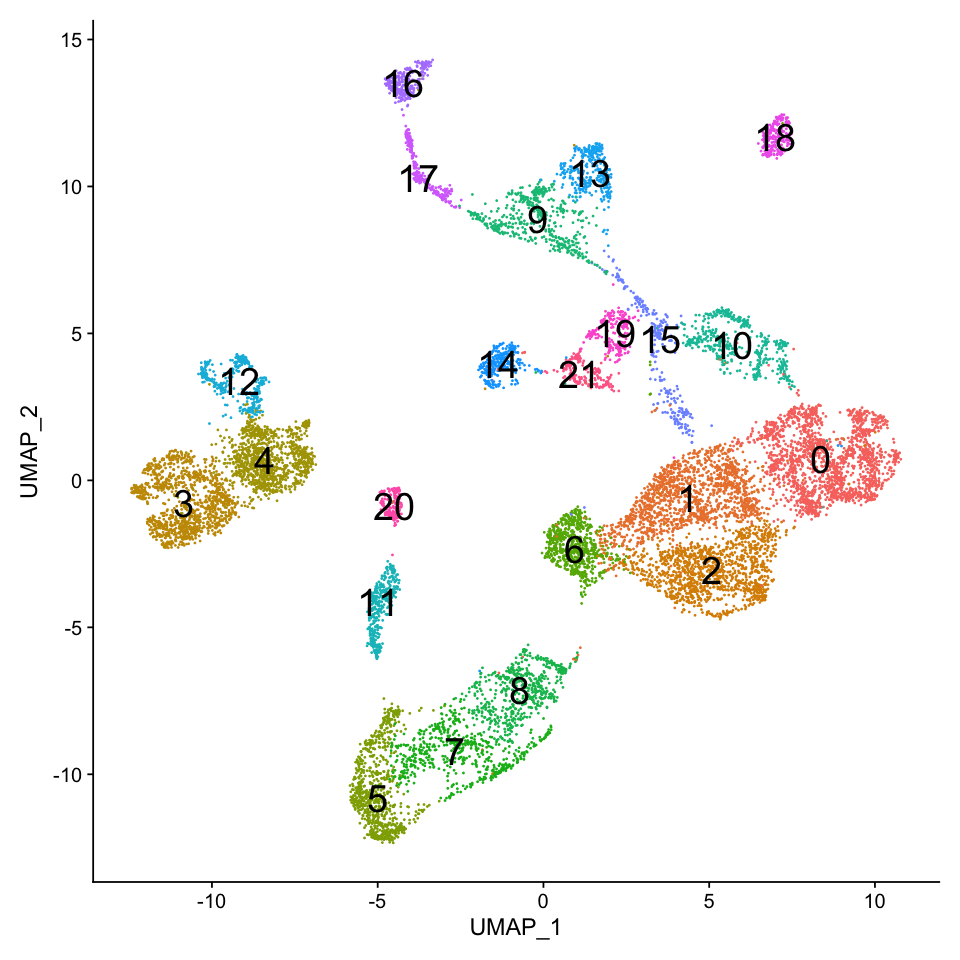

In [5]:
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu_HQC, reduction = 'umap', label = TRUE, label.size = 8) + NoLegend()

## Trunk Mesoderm
### picking up target clusters

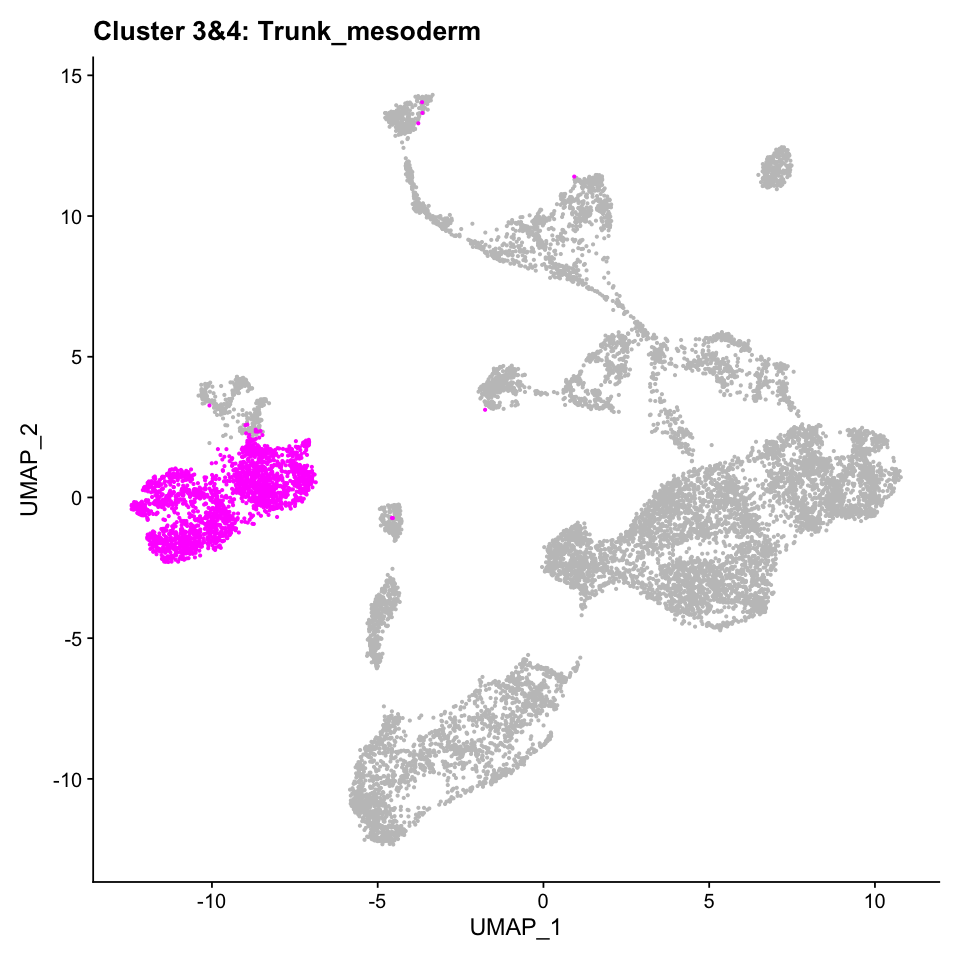

In [6]:
options(repr.plot.width=8, repr.plot.height=8)
highlight.cells <- WhichCells(seu_HQC,idents = c(3,4))
DimPlot(seu_HQC, reduction =  "umap", cells.highlight = highlight.cells, pt.size = 0.5, sizes.highlight = 0.5,
        cols.highlight = 'magenta', label = FALSE) + NoLegend() + ggtitle('Cluster 3&4: Trunk_mesoderm')

In [7]:
seu.trunk.meso <- subset(seu_HQC, idents = c(3,4))
seu.trunk.meso$cluster.allcell <- seu.trunk.meso$seurat_clusters
seu.trunk.meso

An object of class Seurat 
25136 features across 2236 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

### Clustering

$`Set 3`
An object of class Seurat 
25136 features across 1182 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

$`Set 2`
An object of class Seurat 
25136 features across 675 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

$`NK-data`
An object of class Seurat 
25136 features across 228 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

$`Set 1`
An object of class Seurat 
25136 features across 151 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony



Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 9369 by 1182

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 1182 cells



  |======================================================================| 100%


Found 102 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 9369 genes



  |======================================================================| 100%


Computing corrected count matrix for 9369 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 13.06825 secs

Determine variable features

Set 3000 variable features

Place corrected count matrix in counts slot

Regressing out percent.mt, percent.rRNA

Centering data matrix

Set default assay to SCT

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 8592 by 675

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 675 cells



  |======================================================================| 100%


Found 96 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 8592 genes



  |======================================================================| 100%


Computing corrected count matrix for 8592 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 8.050376 secs

Determine variable features

Set 3000 variable features

Place corrected count matrix in counts slot

Regressing out percent.mt, percent.rRNA

Centering data matrix

Set default assay to SCT

Centering data matrix

Centering data matrix



$`Set 3`
An object of class Seurat 
21937 features across 1182 samples within 2 assays 
Active assay: SCT (9369 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

$`Set 2`
An object of class Seurat 
21160 features across 675 samples within 2 assays 
Active assay: SCT (8592 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

$`NK-data`
An object of class Seurat 
25136 features across 228 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

$`Set 1`
An object of class Seurat 
25136 features across 151 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony



Warning message in PrepDR(object = object, features = features, verbose = verbose):
“The following 69 features requested have not been scaled (running reduction without them): CG44956, Gfrl, ss, Ndg, CG4456, Pepck-CG45087, asRNA:CR45889, Cpr64Ad, CG4587, knk, CG31213, CG13403, asRNA:CR44981, CG5327, CG34434, CG43231, CG31778, asRNA:CR45146, asRNA:CR45951, CG12522, lncRNA:CR44973, asRNA:CR46055, TwdlU, lncRNA:CR43640, lncRNA:CR43234, asRNA:CR45807, CG6044, CG34450, CG13012, B9d2, kmg, CG13078, lncRNA:CR44082, ase, TwdlF, Pburs, CG44252, CG45781, Ser, CG15570, CG1572, CG34353, CG42392, Gpb5, yellow-d, lncRNA:CR44178, Dhc36C, Osi22, CG13138, Zw, lncRNA:CR45758, Tret1-1, lncRNA:CR45471, obst-A, CG17139-CG17140, CG15022, azot, CG15449, sns, cato, lncRNA:CR43399, lncRNA:CR45312, asRNA:CR44065, CG9394, CG5810, CG18598, CG18281, Ir60b, Orc3”
PC_ 1 
Positive:  Ubx, CadN, Nrt, lncRNA:bxd, mthl1, nub, Dl, RapGAP1, Myc, abd-A 
	   wech, lncRNA:iab4, lncRNA:roX1, Pka-C3, Glut4EF, pigs, CG1673, stg,

An object of class Seurat 
25136 features across 2236 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 4 dimensional reductions calculated: pca, harmony, umap, umapwoharmony


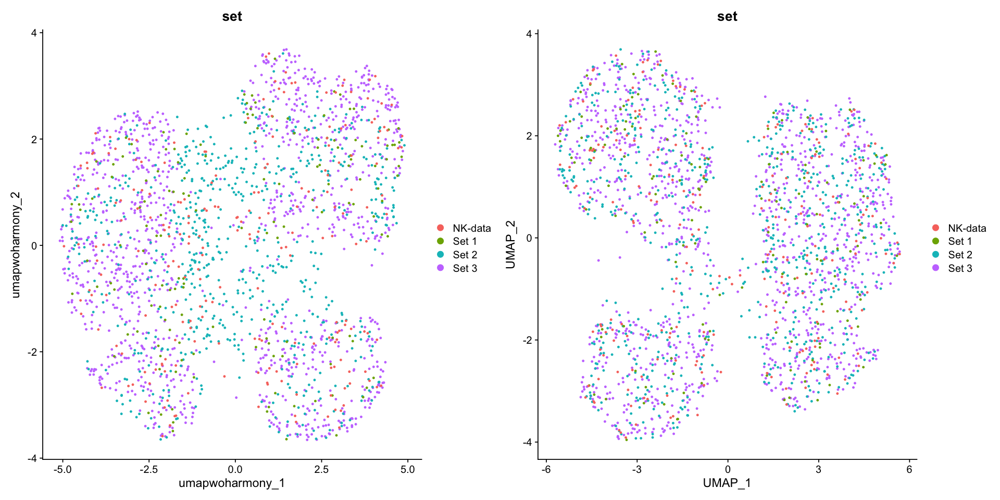

In [8]:
seu.trunk.meso <- func.subclustering.prep(seu.trunk.meso)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 2236
Number of edges: 95573

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7242
Number of communities: 6
Elapsed time: 0 seconds


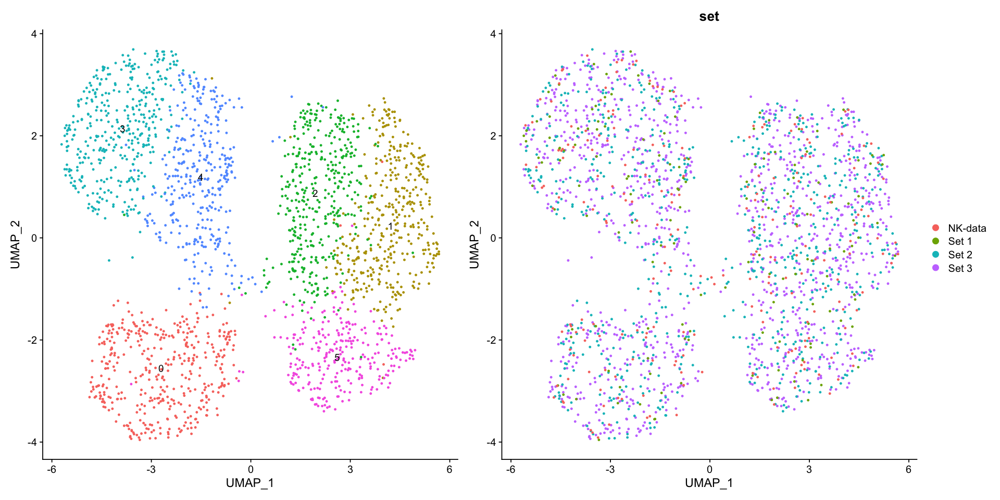

In [9]:
seu.trunk.meso <- func.subclustering(seu.trunk.meso)

In [10]:
all.markers <- FindAllMarkers(object = seu.trunk.meso, only.pos = TRUE)
nrow(all.markers)
all.markers.top10 <- all.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(all.markers.top10)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5



[1] 252

[1] 60

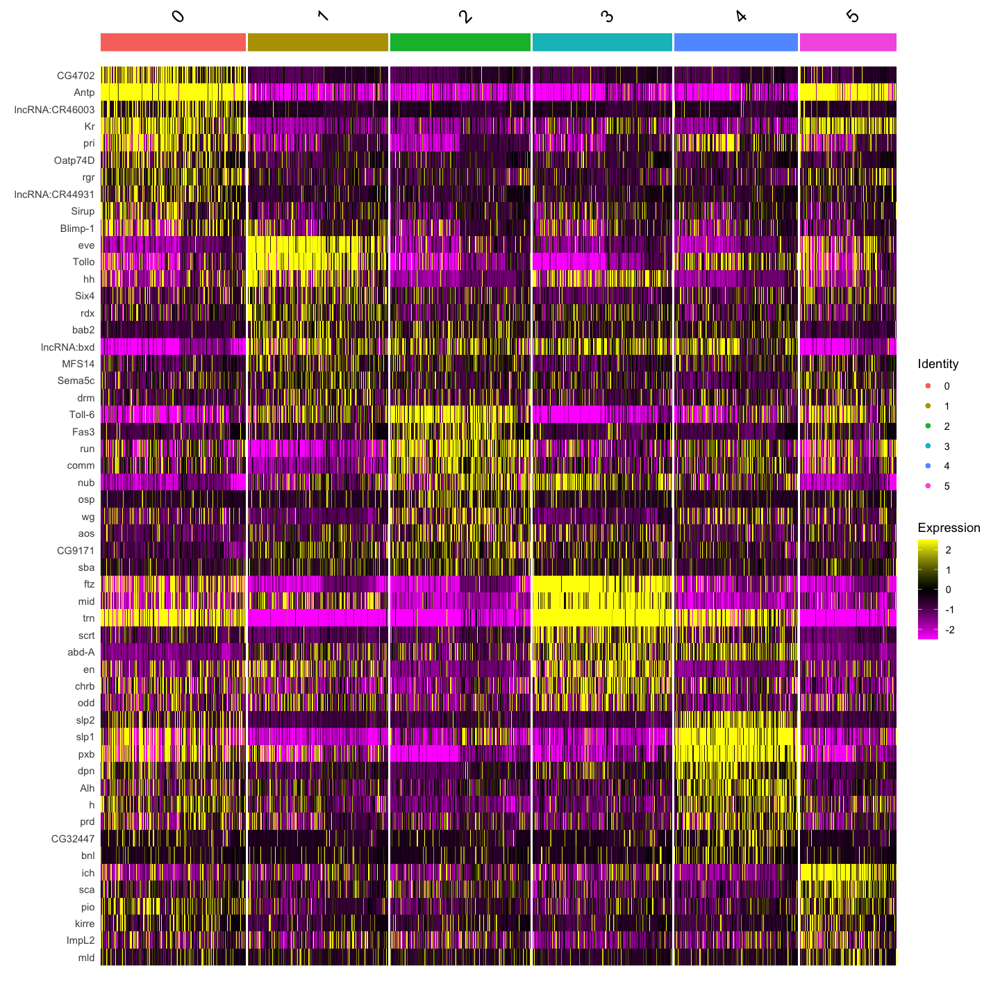

In [11]:
options(repr.plot.width=12, repr.plot.height=12)
DoHeatmap(seu.trunk.meso, features = c(all.markers.top10$gene))

Cluster 0: Antp+, trn+  -->  PS4/PS6  
Cluster 1,2: Antp-, trn- --> abdominal odd  
Cluster 3,4: Antp-, trn+ --> abdominal even  
Cluster 5: Antp+, trn- --> PS5

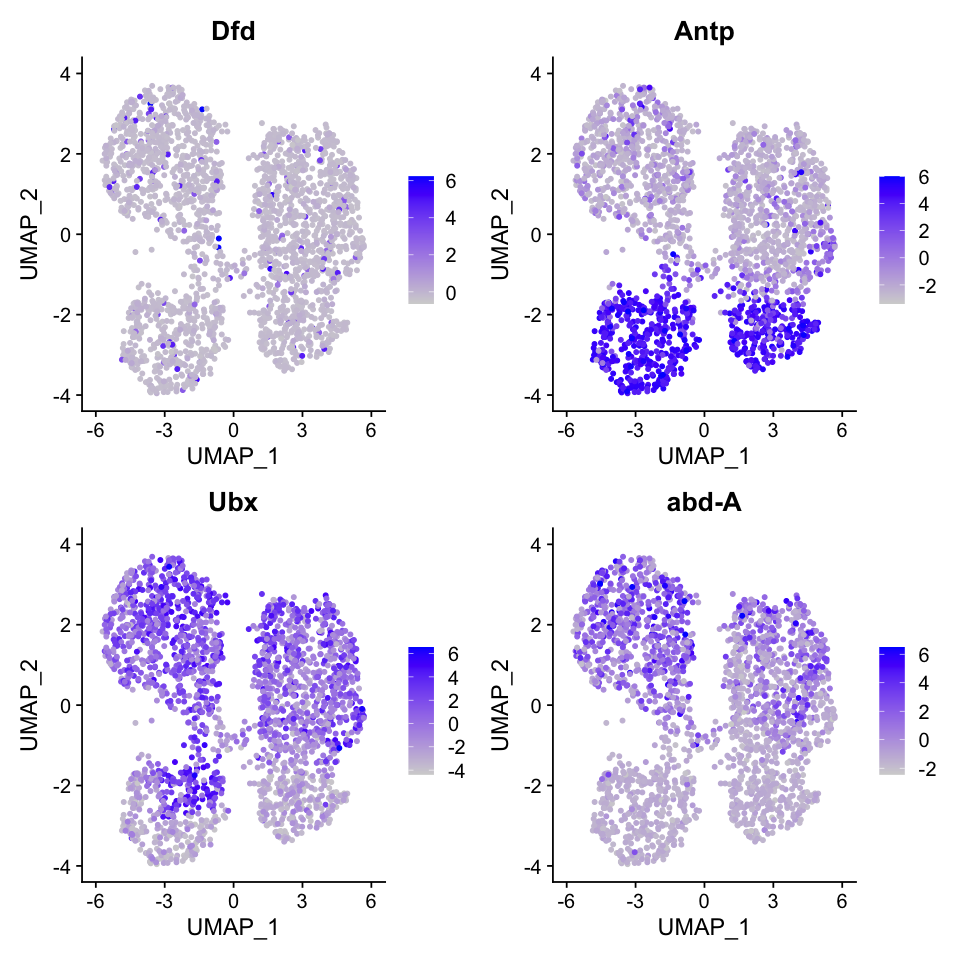

In [12]:
options(repr.plot.width=8, repr.plot.height=8)
FeaturePlot(seu.trunk.meso, reduction = "umap", features = c("Dfd","Antp","Ubx","abd-A"), 
            pt.size = 1,  ncol = 2, slot = 'scale.data')

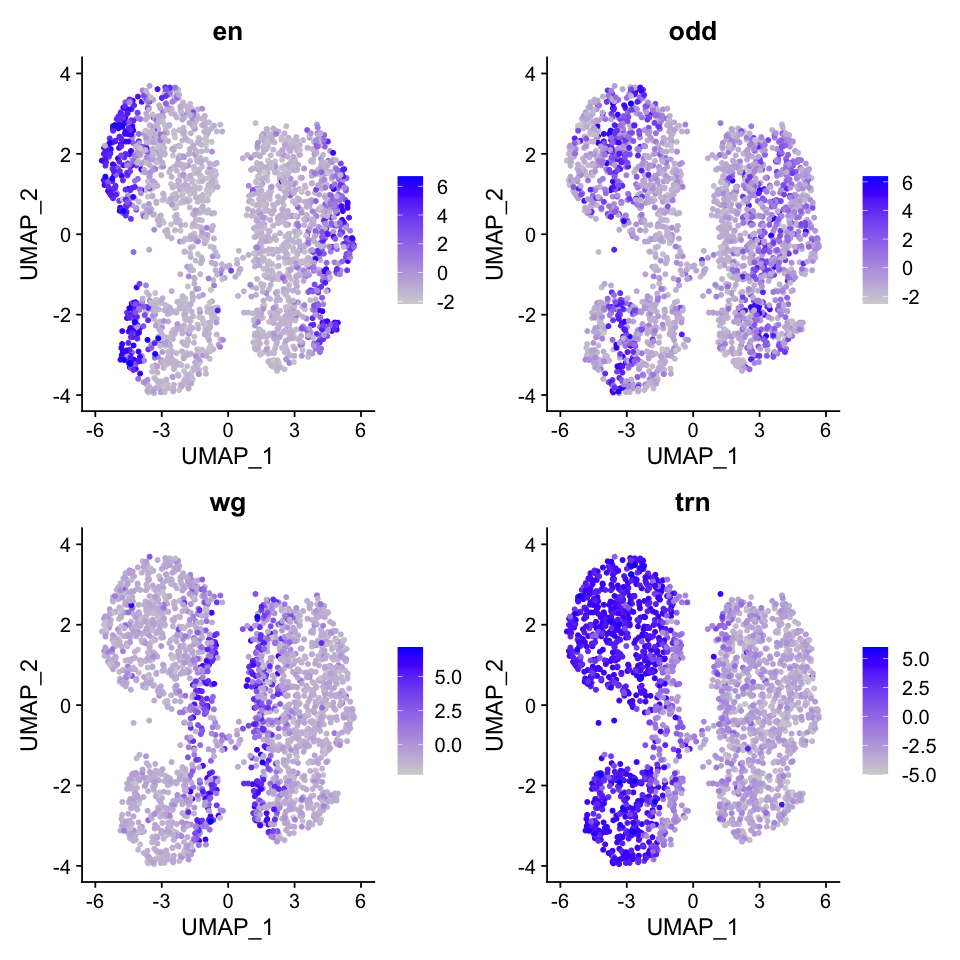

In [13]:
options(repr.plot.width=8, repr.plot.height=8)
FeaturePlot(seu.trunk.meso, reduction = "umap", features = c("en","odd","wg","trn"), 
            pt.size = 1,  ncol = 2, slot = 'scale.data')

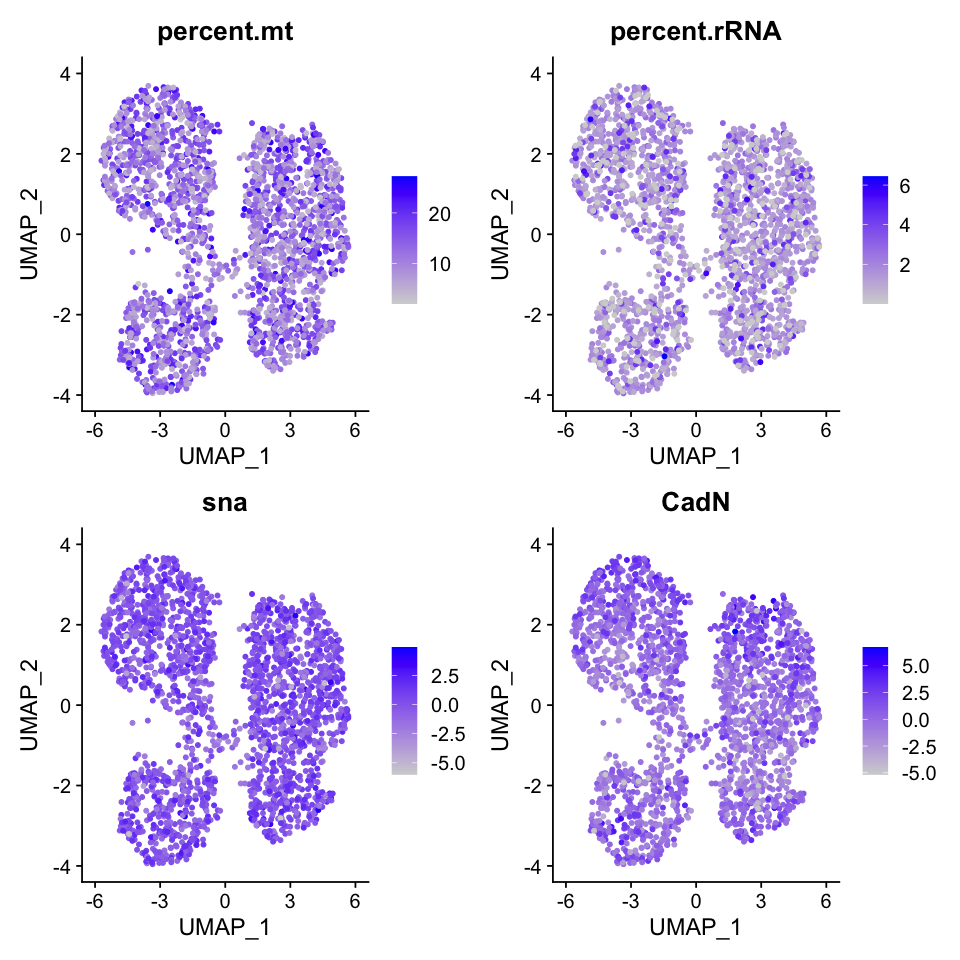

In [14]:
options(repr.plot.width=8, repr.plot.height=8)
FeaturePlot(seu.trunk.meso, reduction = "umap", features = c("percent.mt","percent.rRNA","sna","CadN"), 
            pt.size = 1,  ncol = 2, slot = 'scale.data')

### Trying to separate PS4 and PS6

In [15]:
seu.trunk.meso.c0 <- subset(seu.trunk.meso, idents = 0)
seu.trunk.meso.c0

An object of class Seurat 
25136 features across 414 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 4 dimensional reductions calculated: pca, harmony, umap, umapwoharmony

Warning message in PrepDR(object = object, features = features, verbose = verbose):
“The following 69 features requested have not been scaled (running reduction without them): CG44956, Gfrl, ss, Ndg, CG4456, Pepck-CG45087, asRNA:CR45889, Cpr64Ad, CG4587, knk, CG31213, CG13403, asRNA:CR44981, CG5327, CG34434, CG43231, CG31778, asRNA:CR45146, asRNA:CR45951, CG12522, lncRNA:CR44973, asRNA:CR46055, TwdlU, lncRNA:CR43640, lncRNA:CR43234, asRNA:CR45807, CG6044, CG34450, CG13012, B9d2, kmg, CG13078, lncRNA:CR44082, ase, TwdlF, Pburs, CG44252, CG45781, Ser, CG15570, CG1572, CG34353, CG42392, Gpb5, yellow-d, lncRNA:CR44178, Dhc36C, Osi22, CG13138, Zw, lncRNA:CR45758, Tret1-1, lncRNA:CR45471, obst-A, CG17139-CG17140, CG15022, azot, CG15449, sns, cato, lncRNA:CR43399, lncRNA:CR45312, asRNA:CR44065, CG9394, CG5810, CG18598, CG18281, Ir60b, Orc3”
PC_ 1 
Positive:  lncRNA:bxd, Toll-6, Dl, nub, Ubx, eve, CG1673, abd-A, lncRNA:iab4, fz 
	   shep, Tollo, knrl, CG3036, Glut4EF, luna, CG42762, lncRNA:iab

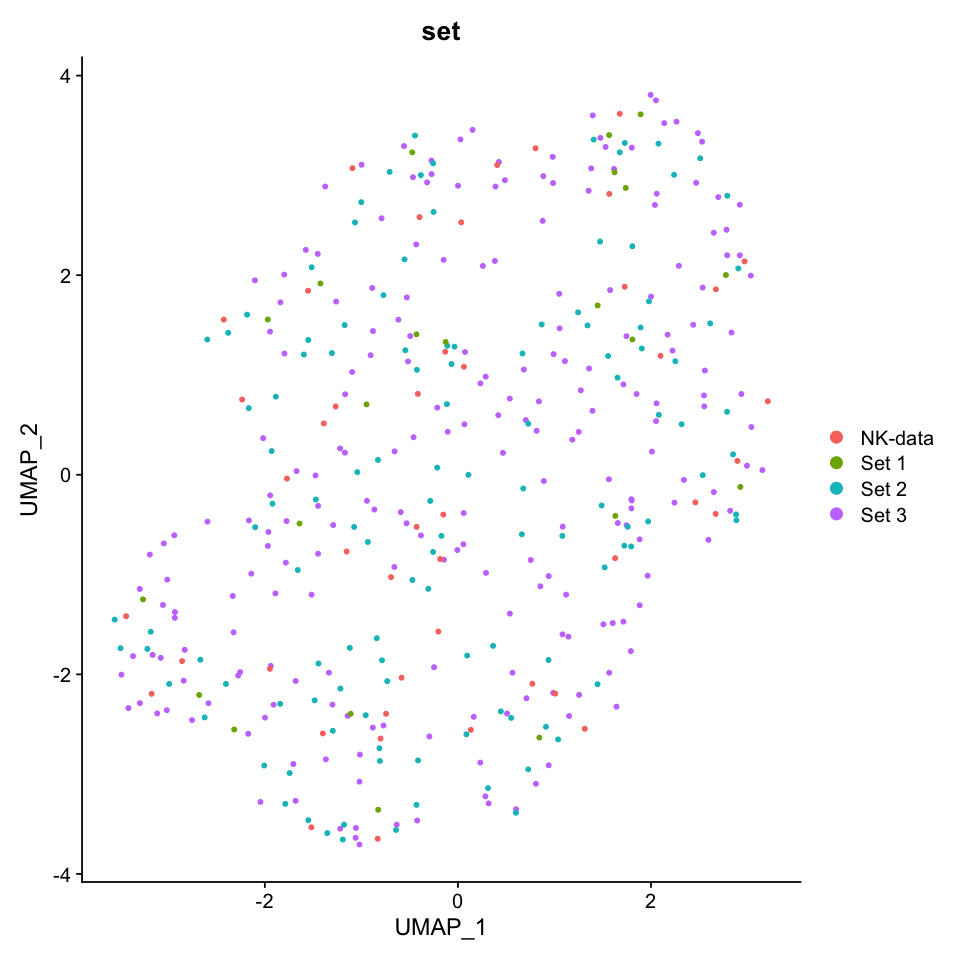

In [16]:
seu.trunk.meso.c0 <- RunPCA(seu.trunk.meso.c0)
seu.trunk.meso.c0 <- RunHarmony(object = seu.trunk.meso.c0, group.by.vars = 'set', assay.use="SCT")
seu.trunk.meso.c0 <- RunUMAP(seu.trunk.meso.c0, dims = 1:30, n.neighbors = 20L, reduction = 'harmony')
options(repr.plot.width=8, repr.plot.height=8)
p <- DimPlot(seu.trunk.meso.c0, reduction = 'umap', group.by = 'set')
plot(p)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 414
Number of edges: 23494

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.4888
Number of communities: 3
Elapsed time: 0 seconds


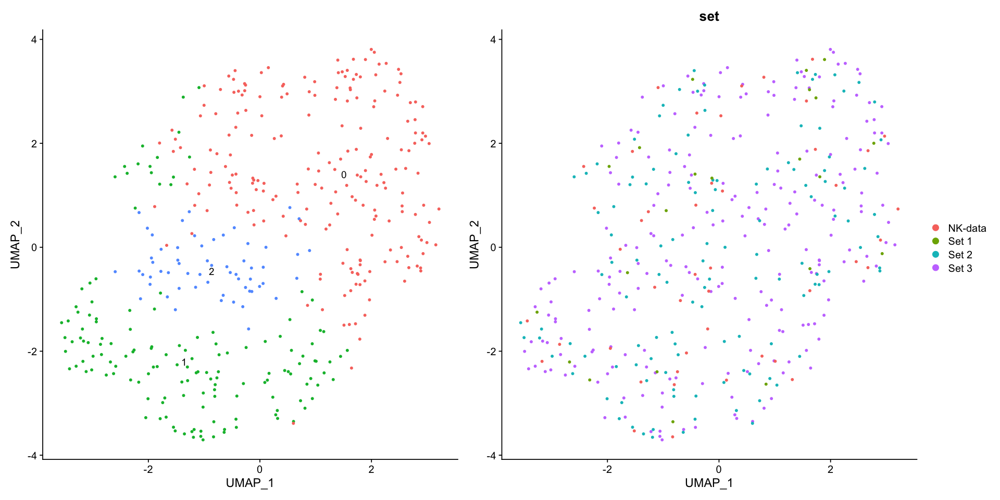

In [17]:
seu.trunk.meso.c0 <- func.subclustering(seu.trunk.meso.c0)

In [18]:
all.markers <- FindAllMarkers(object = seu.trunk.meso.c0, only.pos = TRUE)
nrow(all.markers)
all.markers.top10 <- all.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(all.markers.top10)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2



[1] 142

[1] 30

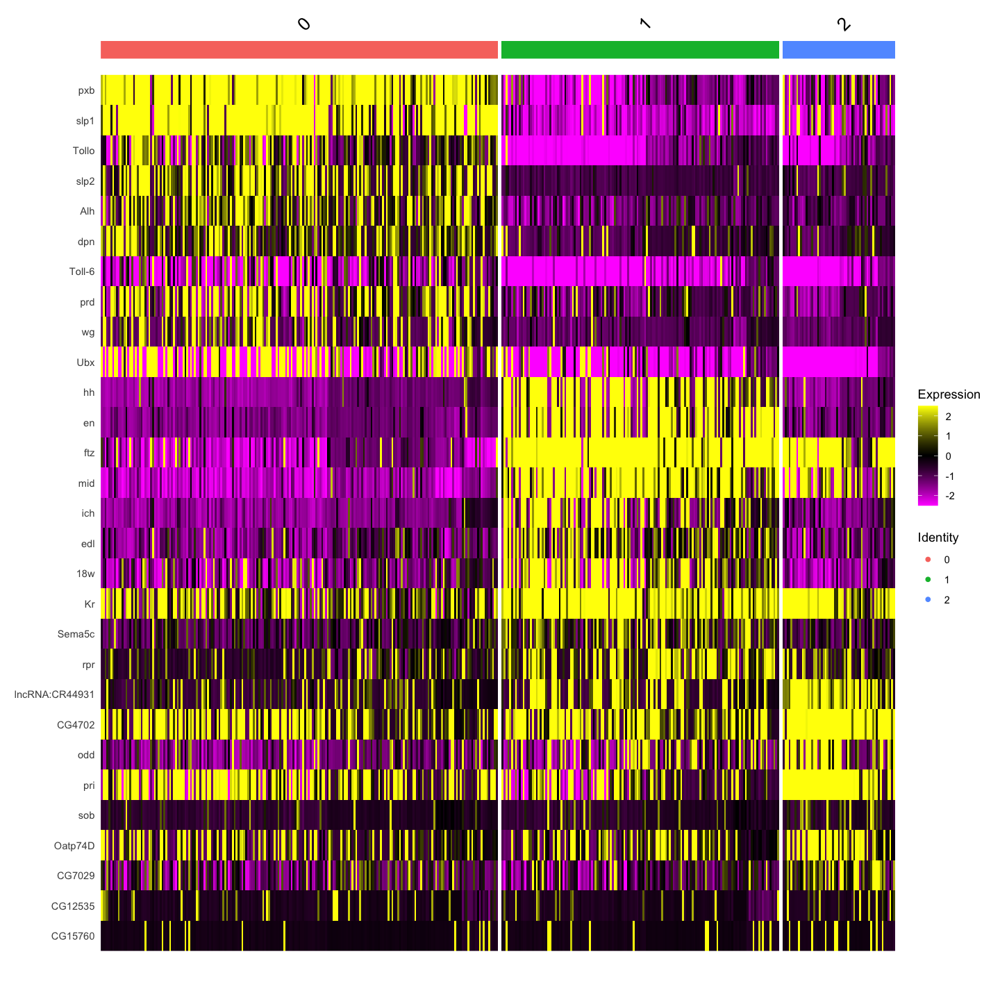

In [19]:
options(repr.plot.width=12, repr.plot.height=12)
DoHeatmap(seu.trunk.meso.c0, features = c(all.markers.top10$gene))

Anterior/Posterior in parasegments

### Add annotation

,manual_ID
,<fct>
Set3_CCGGGTAGTGATGAAT,4
Set3_CTTGAGAGTCGACGCT,4
Set3_TTGAGTGTCAGGTAAA,4
Set3_AAACGCTCAAGTAGTA,0
Set3_AAAGGATGTCGCACAC,0
Set3_AAAGGGCTCAGCACCG,0


,manual_ID
,<fct>
Set3_CCGGGTAGTGATGAAT,mesoderm_abdominal_even
Set3_CTTGAGAGTCGACGCT,mesoderm_abdominal_even
Set3_TTGAGTGTCAGGTAAA,mesoderm_abdominal_even
Set3_AAACGCTCAAGTAGTA,mesoderm_PS4_and_PS6
Set3_AAAGGATGTCGCACAC,mesoderm_PS4_and_PS6
Set3_AAAGGGCTCAGCACCG,mesoderm_PS4_and_PS6


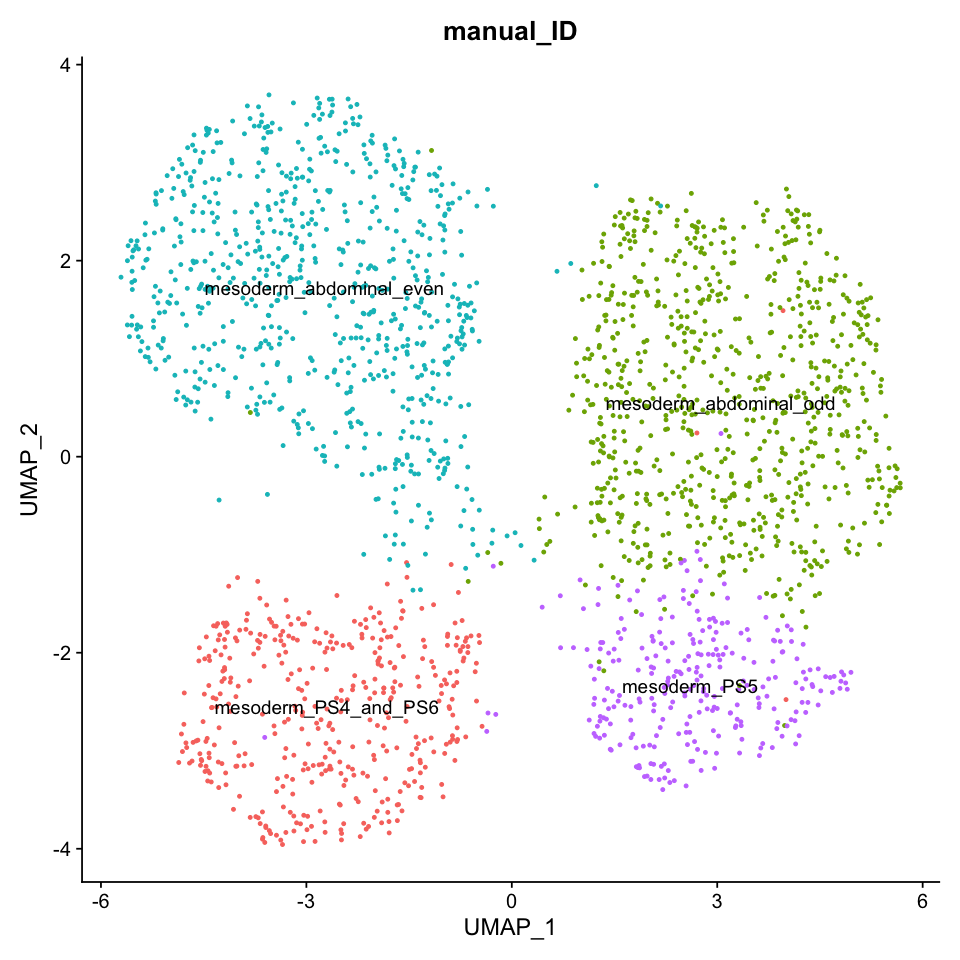

In [20]:
manual_id <- as.data.frame(seu.trunk.meso$seurat_clusters)
colnames(manual_id) <- c('manual_ID')
head(manual_id)
manual_id$manual_ID = dplyr::recode(manual_id$manual_ID, 
                                     "0"="mesoderm_PS4_and_PS6", #Antp+, trn+
                                     "1"="mesoderm_abdominal_odd", #trn-
                                     "2"="mesoderm_abdominal_odd", #trn-
                                     "3"="mesoderm_abdominal_even",#trn-
                                     "4"="mesoderm_abdominal_even",#trn-
                                     "5"="mesoderm_PS5" #Antp+ trn-
                                   )
                                    

head(manual_id)
seu.trunk.meso$manual_ID <- manual_id
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu.trunk.meso, reduction = 'umap', label = T, group.by = 'manual_ID') + NoLegend() 

In [21]:
Idents(seu.trunk.meso) <- 'manual_ID'
levels(seu.trunk.meso) <- c('mesoderm_PS4_and_PS6','mesoderm_PS5',
                            'mesoderm_abdominal_even','mesoderm_abdominal_odd')
all.markers <- FindAllMarkers(object = seu.trunk.meso, only.pos = TRUE)
nrow(all.markers)
all.markers.top10 <- all.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(all.markers.top10)

Calculating cluster mesoderm_PS4_and_PS6

Calculating cluster mesoderm_PS5

Calculating cluster mesoderm_abdominal_even

Calculating cluster mesoderm_abdominal_odd



[1] 179

[1] 40

Saving 7 x 7 in image



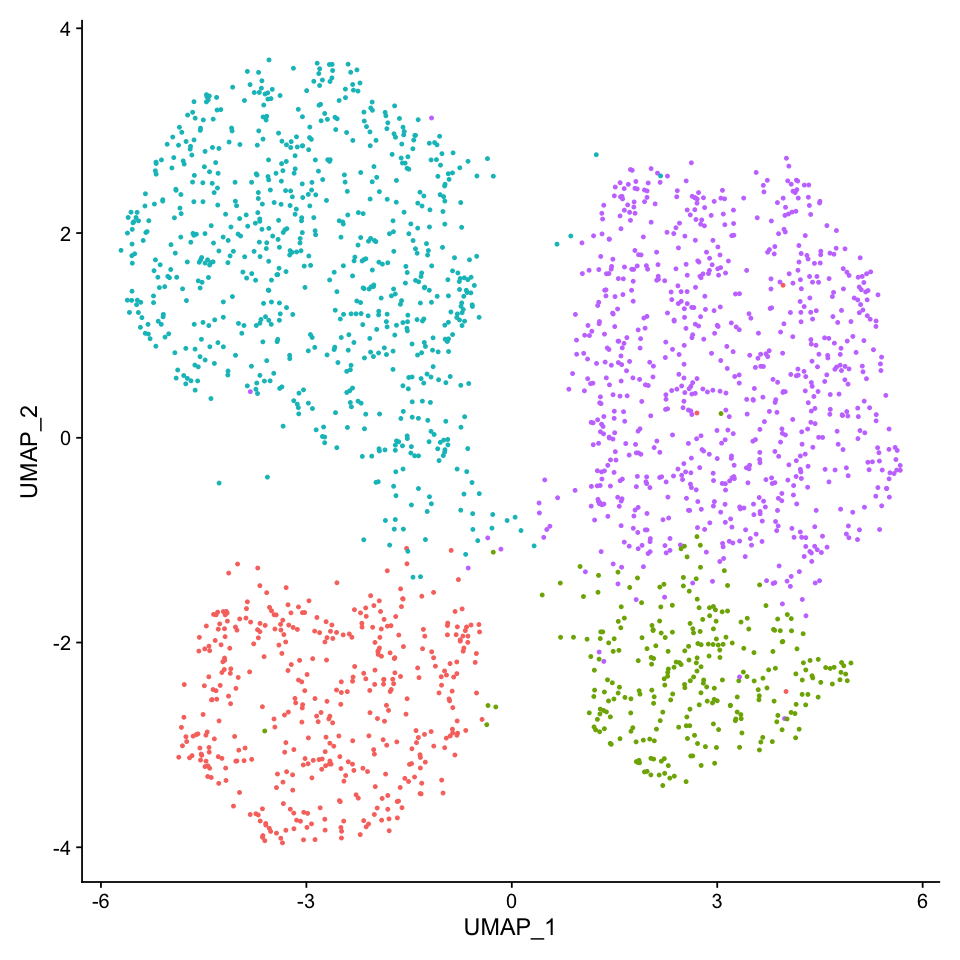

In [22]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu.trunk.meso, reduction =  "umap", label = FALSE) + NoLegend() 

fig
ggsave(fig, file = "./figures/04_meso_subclustering_integrate_all/trunk_meso_umap1.eps", dpi = 300)

Saving 7 x 7 in image



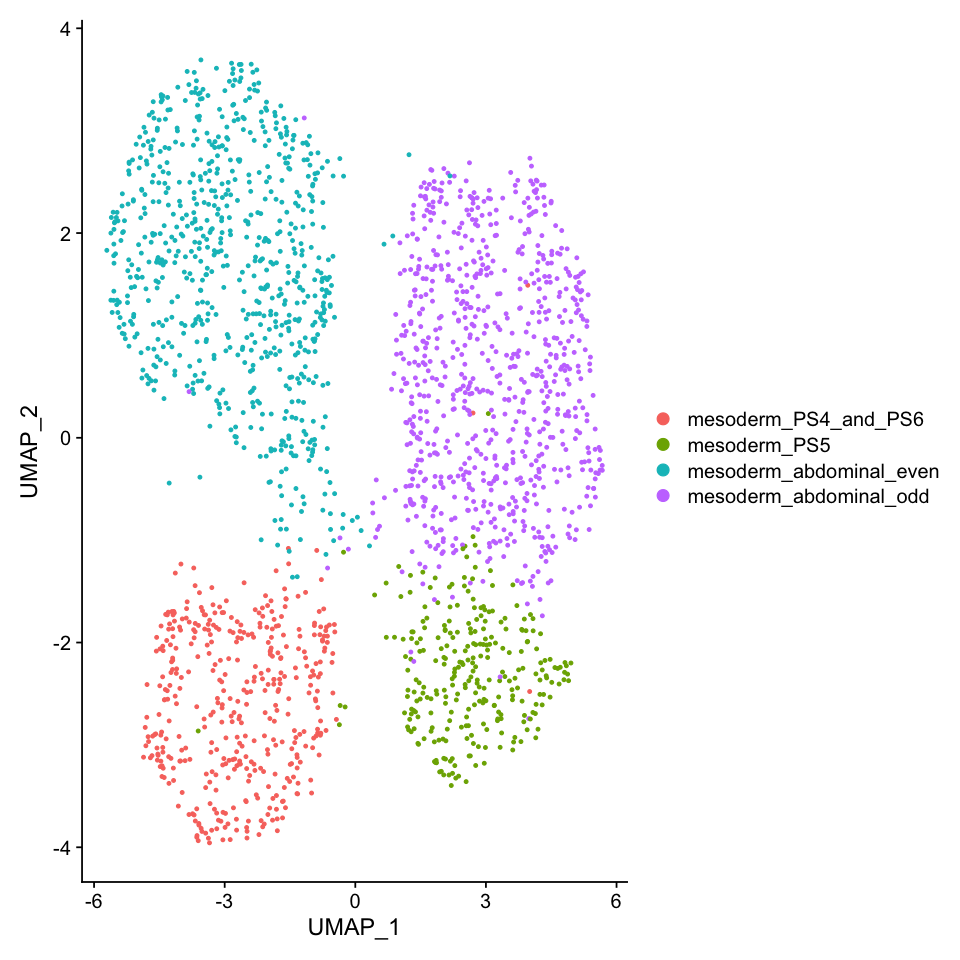

In [23]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu.trunk.meso, reduction =  "umap", label = FALSE)

fig
ggsave(fig, file = "./figures/04_meso_subclustering_integrate_all/trunk_meso_umap2.eps", dpi = 300)

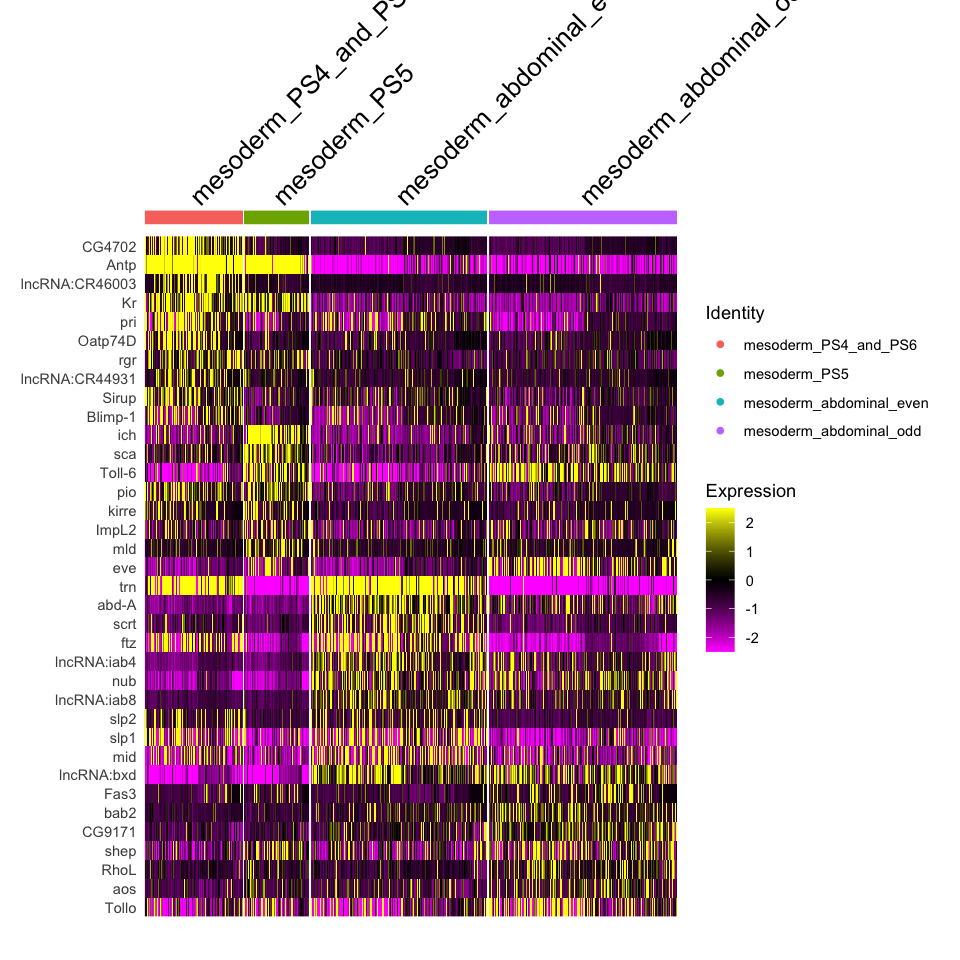

In [24]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DoHeatmap(seu.trunk.meso, features = c(all.markers.top10$gene))
fig
ggsave(fig, file = "./figures/04_meso_subclustering_integrate_all/trunk_meso_manualID_heatmap.eps", dpi = 300,  width = 12, height = 8)

## Anterior mesoderm (gcm+)
### Picking up target clusters

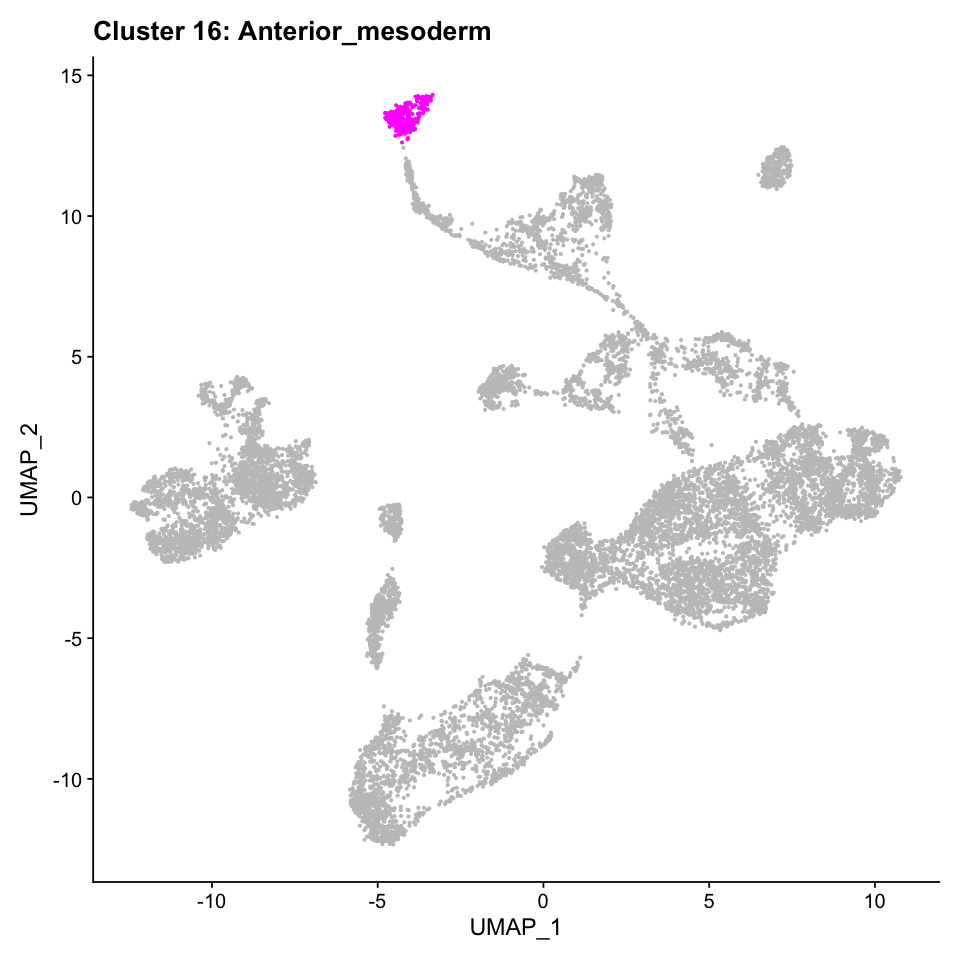

In [25]:
options(repr.plot.width=8, repr.plot.height=8)
highlight.cells <- WhichCells(seu_HQC,idents = c(16))
DimPlot(seu_HQC, reduction =  "umap", cells.highlight = highlight.cells, pt.size = 0.5, sizes.highlight = 0.5,
        cols.highlight = 'magenta', label = FALSE) + NoLegend() + ggtitle('Cluster 16: Anterior_mesoderm')

In [26]:
seu.meso.gcm <- subset(seu_HQC, ident = 16)
seu.meso.gcm

An object of class Seurat 
25136 features across 277 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

### Clustering

$`Set 3`
An object of class Seurat 
25136 features across 140 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

$`Set 2`
An object of class Seurat 
25136 features across 52 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

$`NK-data`
An object of class Seurat 
25136 features across 52 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

$`Set 1`
An object of class Seurat 
25136 features across 33 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony



Centering data matrix

Centering data matrix

Centering data matrix

Centering data matrix



$`Set 3`
An object of class Seurat 
25136 features across 140 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

$`Set 2`
An object of class Seurat 
25136 features across 52 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

$`NK-data`
An object of class Seurat 
25136 features across 52 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

$`Set 1`
An object of class Seurat 
25136 features across 33 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony



PC_ 1 
Positive:  vvl, Dfd, kn, rpr, glec, gt, slp1, smal, sty, slp2 
	   grim, tin, Tollo, sprt, px, noc, Toll-6, pxb, lncRNA:Hsromega, CG43355-sala 
	   twi, prd, lncRNA:CR30009, CG17716, Ndae1, CadN, htl, sna, Dmtn, GEFmeso 
Negative:  ttk, DNaseII, srp, cv-c, Pvr, Nplp2, fok, Oatp74D, CG14427, RhoL 
	   Glut4EF, edl, trn, CG13300, dve, CG16758, shep, ush, SoxN, Npc2g 
	   CrebA, luna, Pka-C3, Gbs-70E, CG30069, CG33099, phu, CG3036, bnl, CG5756 
PC_ 2 
Positive:  edl, Lim1, CG3036, CG3502, Pka-C3, Ldh, CG13427, DNaseII, CG11498, CG43184 
	   sog, gt, oc, Cad88C, ttk, htl, lab, mirr, CG16886, CG8260 
	   pros, Oatp74D, Sec61beta, mt:Cyt-b, CG43085, Hsp26, Ald, side, eEF1alpha2, CG17119 
Negative:  fok, CadN, CG14688, pigs, smal, rpr, NetB, CG10570-CG42502, CG12177, CG14427 
	   CrebA, twi, CG42389, SoxN, Dfd, hll, Mef2, VepD, CG33099, bnl 
	   Mes2, Ire1, CG2865, CG43658, grim, be, sty, kn, vvl, zfh1 
PC_ 3 
Positive:  SoxN, fok, bnl, Pvr, gcm, trn, CG14427, MFS14, Tollo, cv-d 
	   D

An object of class Seurat 
25136 features across 277 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 4 dimensional reductions calculated: pca, harmony, umap, umapwoharmony


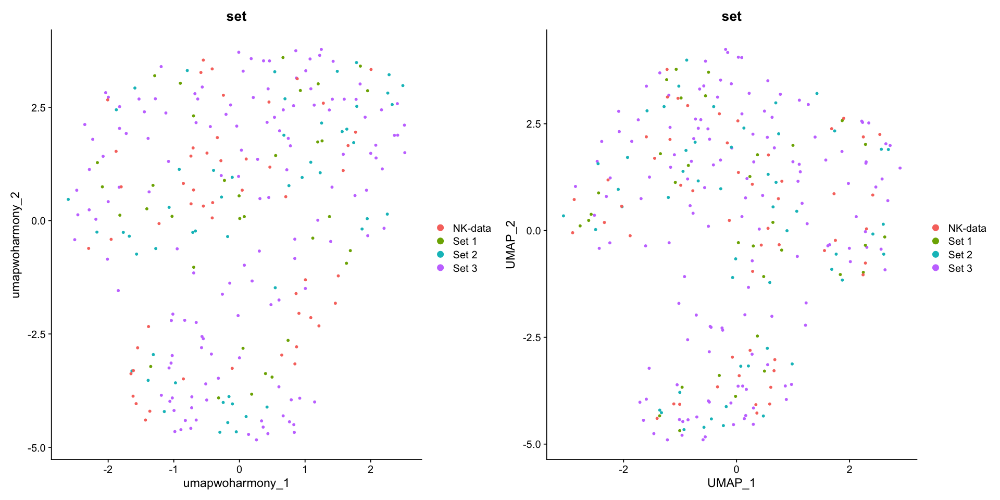

In [27]:
seu.meso.gcm <- func.subclustering.prep(seu.meso.gcm)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 277
Number of edges: 19711

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.4113
Number of communities: 3
Elapsed time: 0 seconds


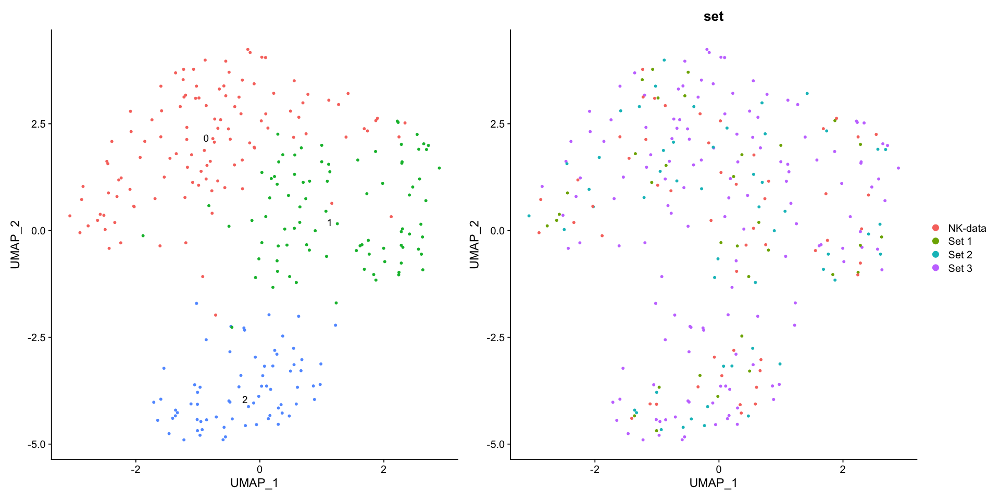

In [28]:
seu.meso.gcm <-func.subclustering(seu.meso.gcm)

In [29]:
all.markers <- FindAllMarkers(object = seu.meso.gcm, only.pos = TRUE)
nrow(all.markers)
all.markers.top10 <- all.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(all.markers.top10)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2



[1] 220

[1] 30

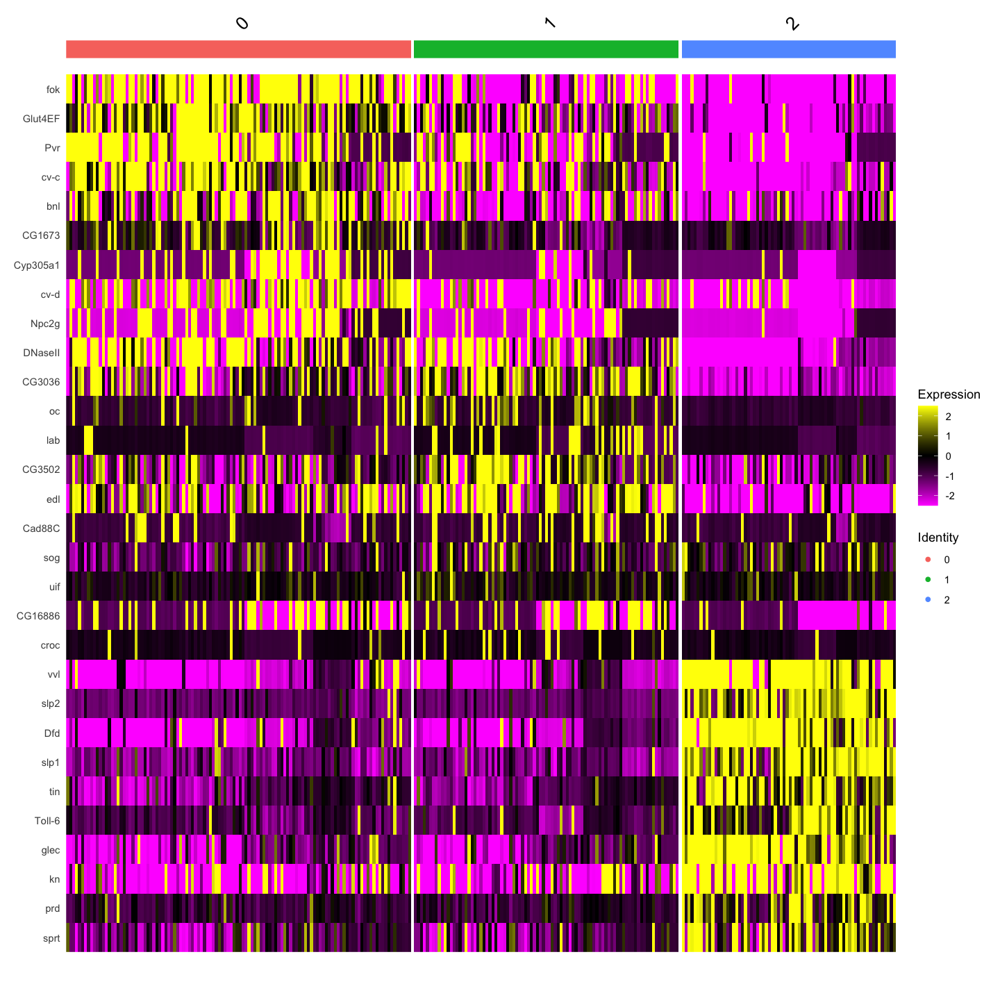

In [30]:
options(repr.plot.width=12, repr.plot.height=12)
DoHeatmap(seu.meso.gcm, features = c(all.markers.top10$gene))

### Add annotation

,manual_ID
,<fct>
Set3_AAACGCTCAGCCCACA,2
Set3_AAAGTGATCTATCACT,0
Set3_AACCTTTTCGAGAACG,0
Set3_AACTTCTGTAGTGGCA,2
Set3_AAGAACAAGCAGGTCA,1
Set3_AAGATAGTCACTCTTA,0


,manual_ID
,<fct>
Set3_AAACGCTCAGCCCACA,mesoderm_gcm_Dfd
Set3_AAAGTGATCTATCACT,mesoderm_gcm
Set3_AACCTTTTCGAGAACG,mesoderm_gcm
Set3_AACTTCTGTAGTGGCA,mesoderm_gcm_Dfd
Set3_AAGAACAAGCAGGTCA,mesoderm_gcm
Set3_AAGATAGTCACTCTTA,mesoderm_gcm


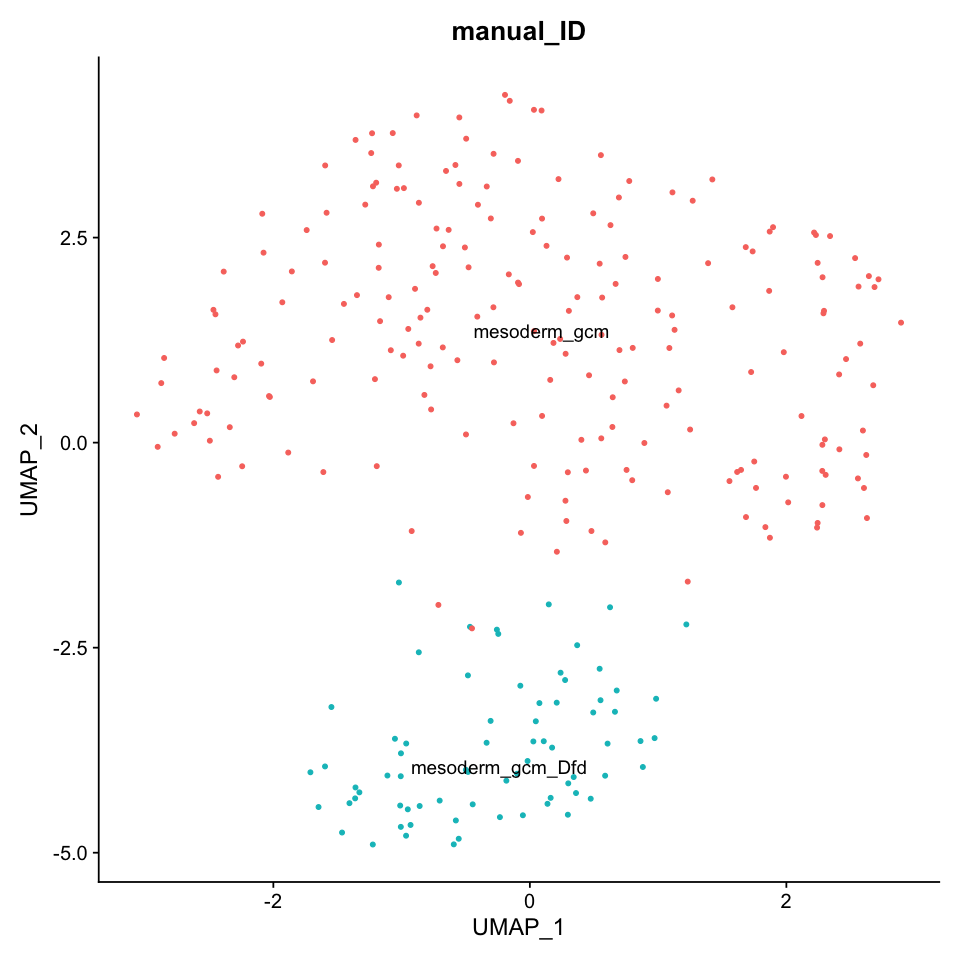

In [31]:
manual_id <- as.data.frame(seu.meso.gcm$seurat_clusters)
colnames(manual_id) <- c('manual_ID')
head(manual_id)
manual_id$manual_ID = dplyr::recode(manual_id$manual_ID, 
                                     "0"="mesoderm_gcm", 
                                     "1"="mesoderm_gcm",
                                     "2"="mesoderm_gcm_Dfd" #Dfd+
                                   )
                                    

head(manual_id)
seu.meso.gcm$manual_ID <- manual_id
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu.meso.gcm, reduction = 'umap', label = T, group.by = 'manual_ID') + NoLegend() 

In [32]:
Idents(seu.meso.gcm) <- 'manual_ID'
levels(seu.meso.gcm) <- c('mesoderm_gcm','mesoderm_gcm_Dfd')
all.markers <- FindAllMarkers(object = seu.meso.gcm, only.pos = TRUE)
nrow(all.markers)
all.markers.top10 <- all.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(all.markers.top10)

Calculating cluster mesoderm_gcm

Calculating cluster mesoderm_gcm_Dfd



[1] 217

[1] 20

Saving 7 x 7 in image



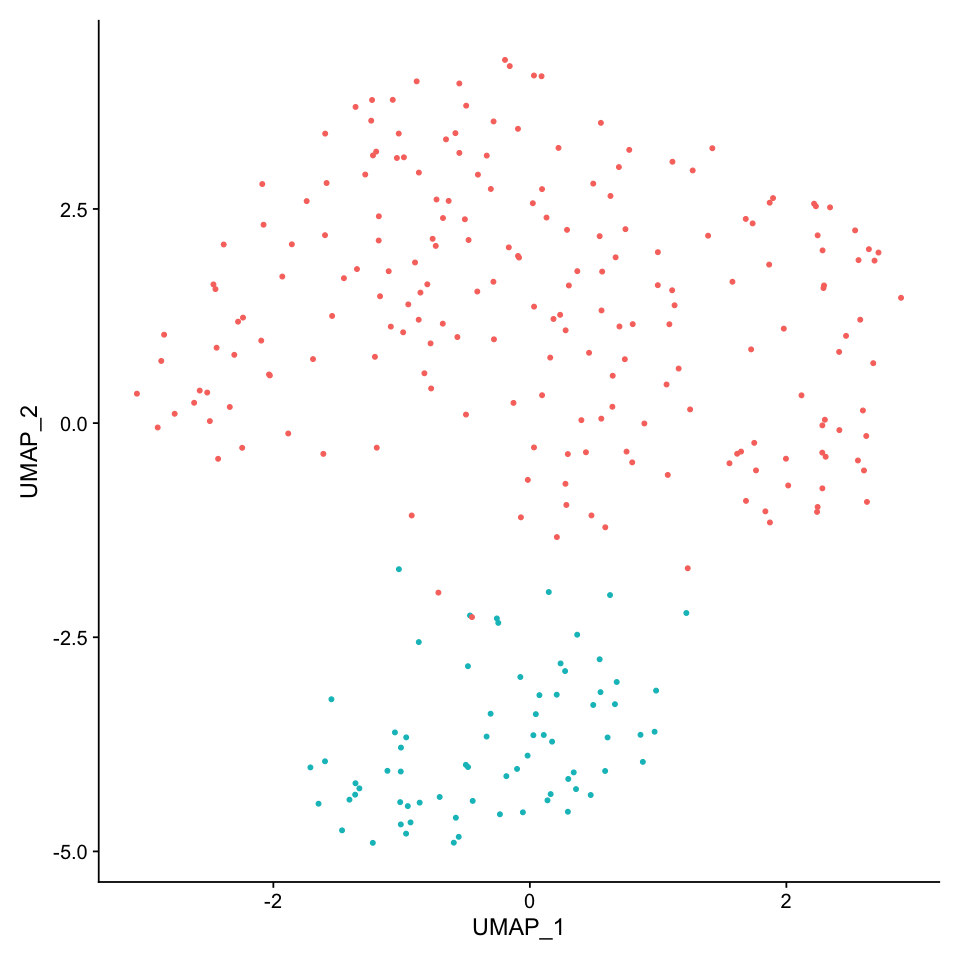

In [33]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu.meso.gcm, reduction =  "umap", label = FALSE) + NoLegend() 

fig
ggsave(fig, file = "./figures/04_meso_subclustering_integrate_all/meso_gcm_umap1.eps", dpi = 300)

Saving 7 x 7 in image



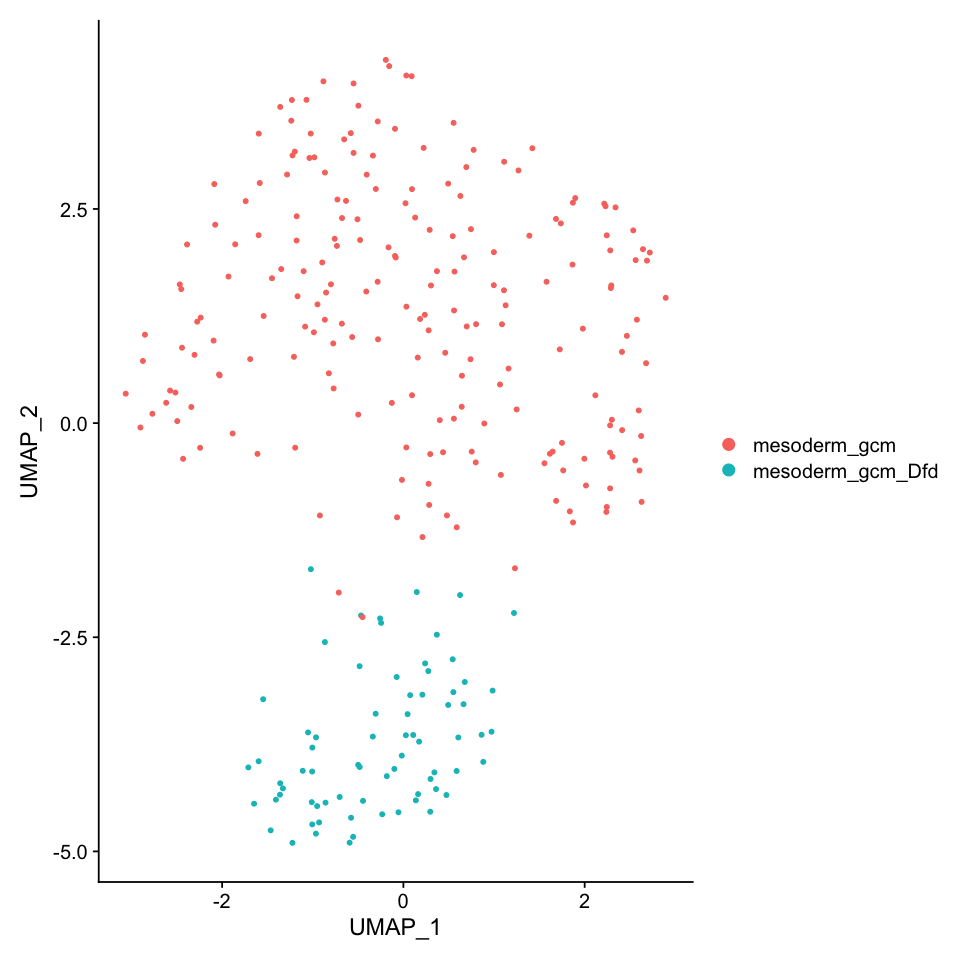

In [34]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu.meso.gcm, reduction =  "umap", label = FALSE) 

fig
ggsave(fig, file = "./figures/04_meso_subclustering_integrate_all/meso_gcm_umap2.eps", dpi = 300)

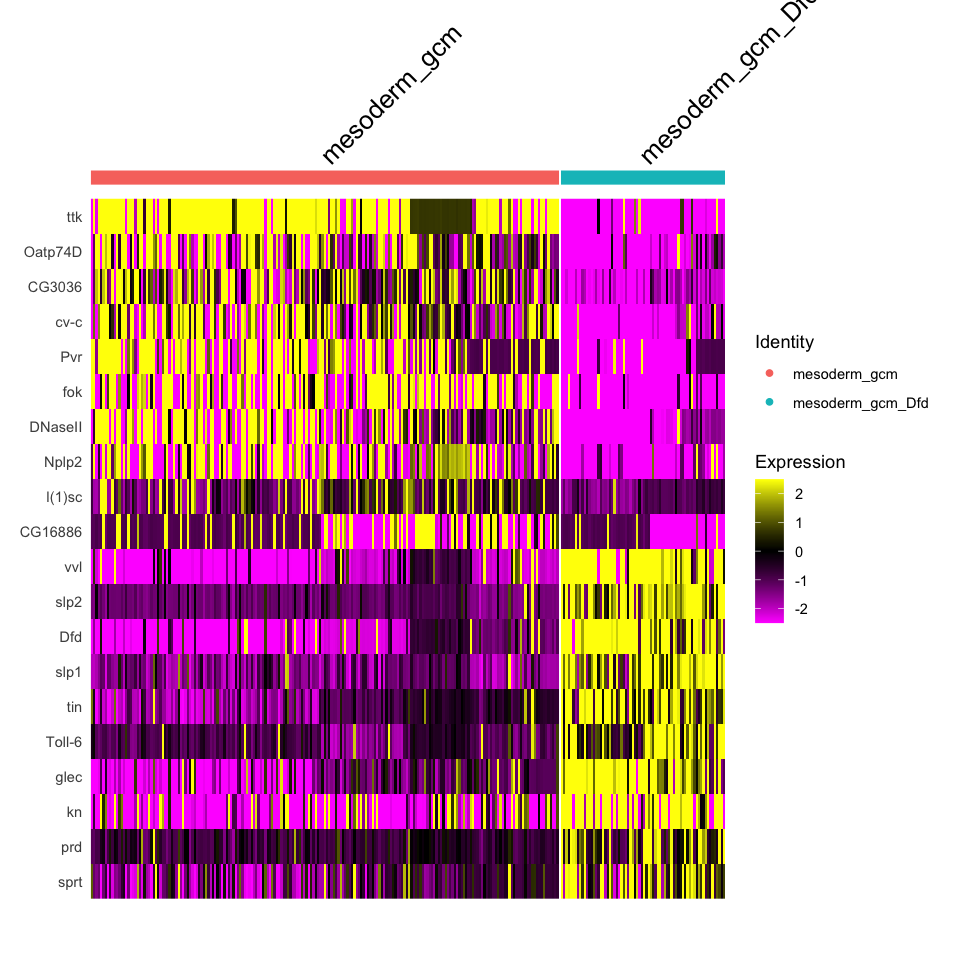

In [35]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DoHeatmap(seu.meso.gcm, features = c(all.markers.top10$gene))
fig
ggsave(fig, file = "./figures/04_meso_subclustering_integrate_all/meso_gcm_manualID_heatmap.eps", dpi = 300,  width = 12, height = 8)

## Anterior midgut/ Head mesoderm
### Picking up target clusters

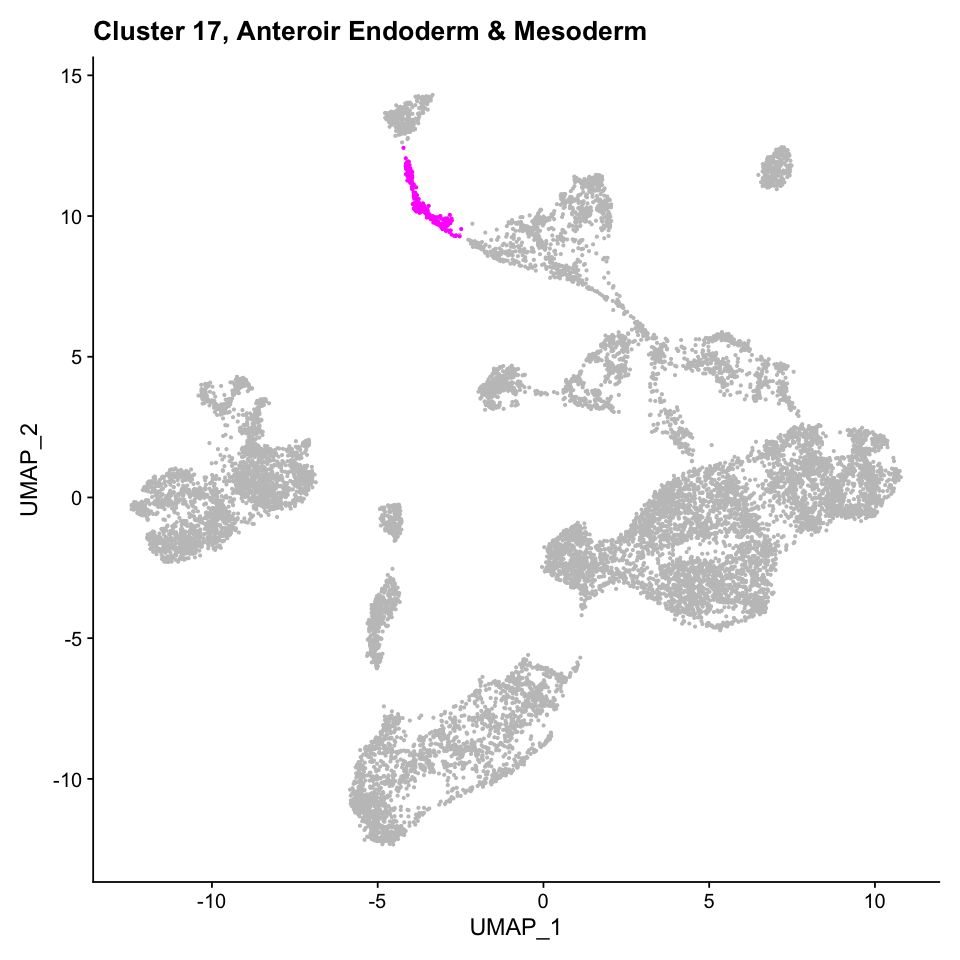

In [36]:
options(repr.plot.width=8, repr.plot.height=8)
highlight.cells <- WhichCells(seu_HQC,idents = c(17))
DimPlot(seu_HQC, reduction =  "umap", cells.highlight = highlight.cells, pt.size = 0.5, sizes.highlight = 0.5,
        cols.highlight = 'magenta', label = FALSE) + NoLegend()+ ggtitle('Cluster 17, Anteroir Endoderm & Mesoderm')

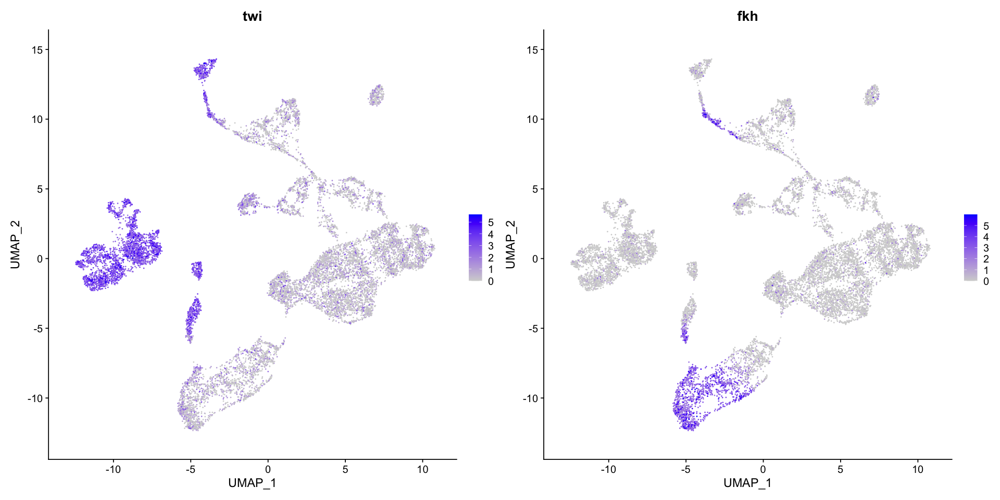

In [37]:
options(repr.plot.width=16, repr.plot.height=8)
FeaturePlot(seu_HQC, reduction = 'umap', features = c('twi', 'fkh'))

In [38]:
seu.ant <- subset(seu_HQC, ident = 17)
seu.ant

An object of class Seurat 
25136 features across 264 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

### Clustering

$`Set 3`
An object of class Seurat 
25136 features across 129 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

$`Set 2`
An object of class Seurat 
25136 features across 59 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

$`NK-data`
An object of class Seurat 
25136 features across 57 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

$`Set 1`
An object of class Seurat 
25136 features across 19 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony



Centering data matrix

Centering data matrix

Centering data matrix

Centering data matrix



$`Set 3`
An object of class Seurat 
25136 features across 129 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

$`Set 2`
An object of class Seurat 
25136 features across 59 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

$`NK-data`
An object of class Seurat 
25136 features across 57 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

$`Set 1`
An object of class Seurat 
25136 features across 19 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony



PC_ 1 
Positive:  gt, croc, Lim1, Pka-C3, zfh1, Ilp4, twi, Optix, DIP-epsilon, CG33099 
	   CadN, htl, CG3036, NetA, CG12177, CG43184, NetB, noc, Cyp310a1, hll 
	   stg, Ama, Mes2, Ald, Alp1, stl, if, sna, chrb, Drat 
Negative:  fkh, ImpE2, hkb, ab, CG14427, srp, odd, wg, trn, Adgf-A 
	   Mdr49, Fas2, mirr, peb, CG31038, GstT4, Oatp74D, CG8468, CG11905, drm 
	   fj, caup, amd, Tom, CG13653, Tl, ps, RyR, CG14204, Brd 
PC_ 2 
Positive:  srp, DNaseII, bun, cv-c, edl, Optix, Ilp4, Act87E, hll, hkb 
	   CG7029, trn, wntD, CG31038, Mes2, twi, CG16758, TwdlE, Aldh, CG14688 
	   fkh, CG14535, CG32053, GlcAT-P, CG8468, peb, be, VepD, stg, stl 
Negative:  gt, CG13427, wg, ab, Tom, Brd, CG13653, odd, tin, E(spl)m4-BFM 
	   disco, CG4440, CG43085, Pka-C3, zfh1, Lac, Lim1, kni, eya, croc 
	   sim, CG42342, amd, hh, wb, drm, fj, crb, gogo, E(spl)m7-HLH 
PC_ 3 
Positive:  Ldh, croc, lncRNA:Hsromega, Tl, bun, Optix, mirr, E(spl)m4-BFM, edl, E(spl)m7-HLH 
	   sog, Ndae1, CG42342, Btk29A, knrl, E(spl)m6

An object of class Seurat 
25136 features across 264 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 4 dimensional reductions calculated: pca, harmony, umap, umapwoharmony


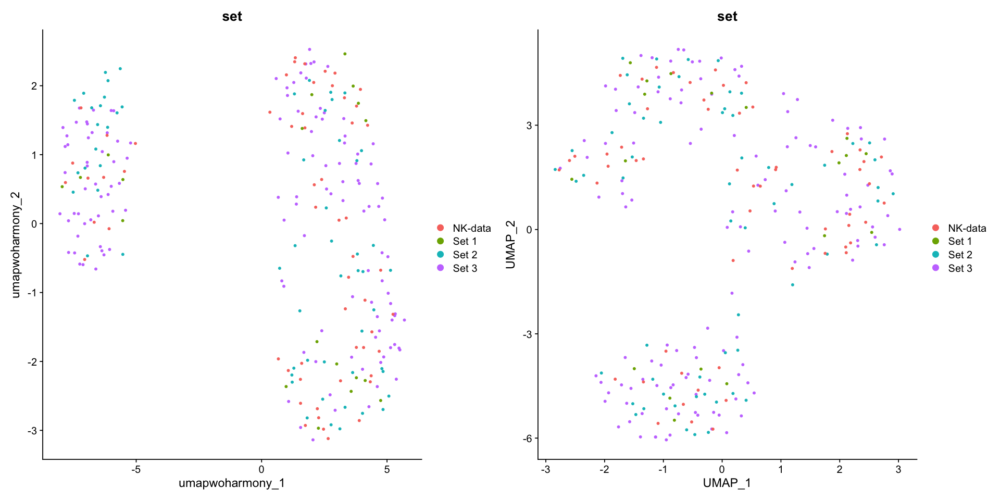

In [39]:
seu.ant <- func.subclustering.prep(seu.ant)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 264
Number of edges: 12547

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.6383
Number of communities: 3
Elapsed time: 0 seconds


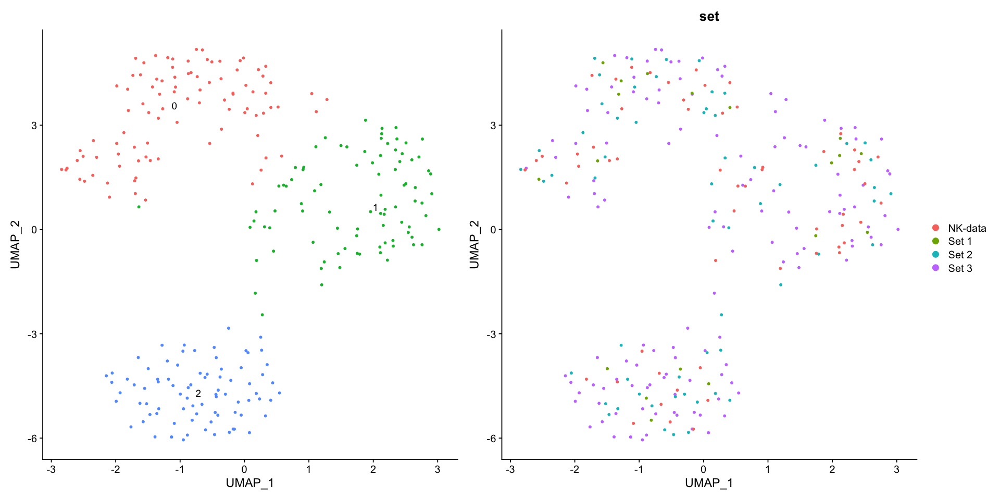

In [40]:
seu.ant <- func.subclustering(seu.ant)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 264
Number of edges: 12547

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.4111
Number of communities: 4
Elapsed time: 0 seconds


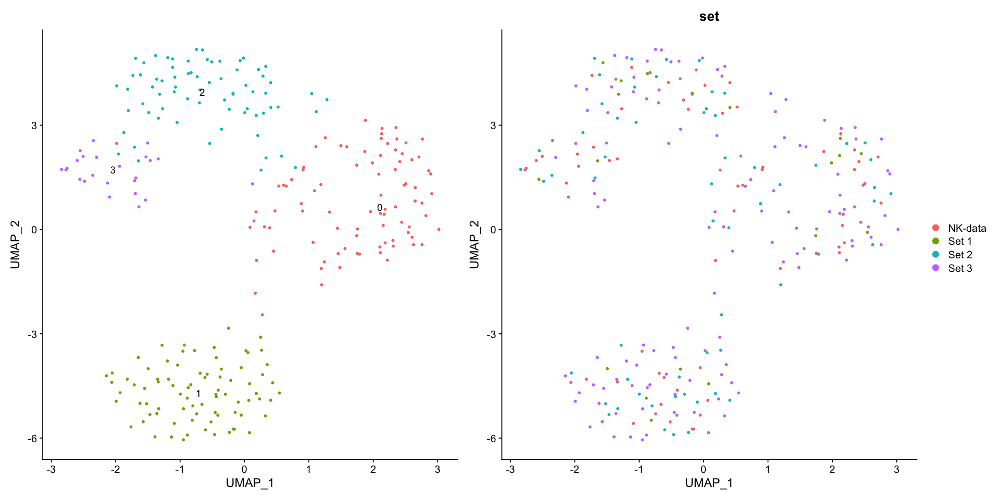

In [41]:
seu.ant <- func.subclustering(seu.ant, resolution = 1.5)

In [42]:
all.markers <- FindAllMarkers(object = seu.ant, only.pos = TRUE)
nrow(all.markers)
all.markers.top10 <- all.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(all.markers.top10)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3



[1] 620

[1] 40

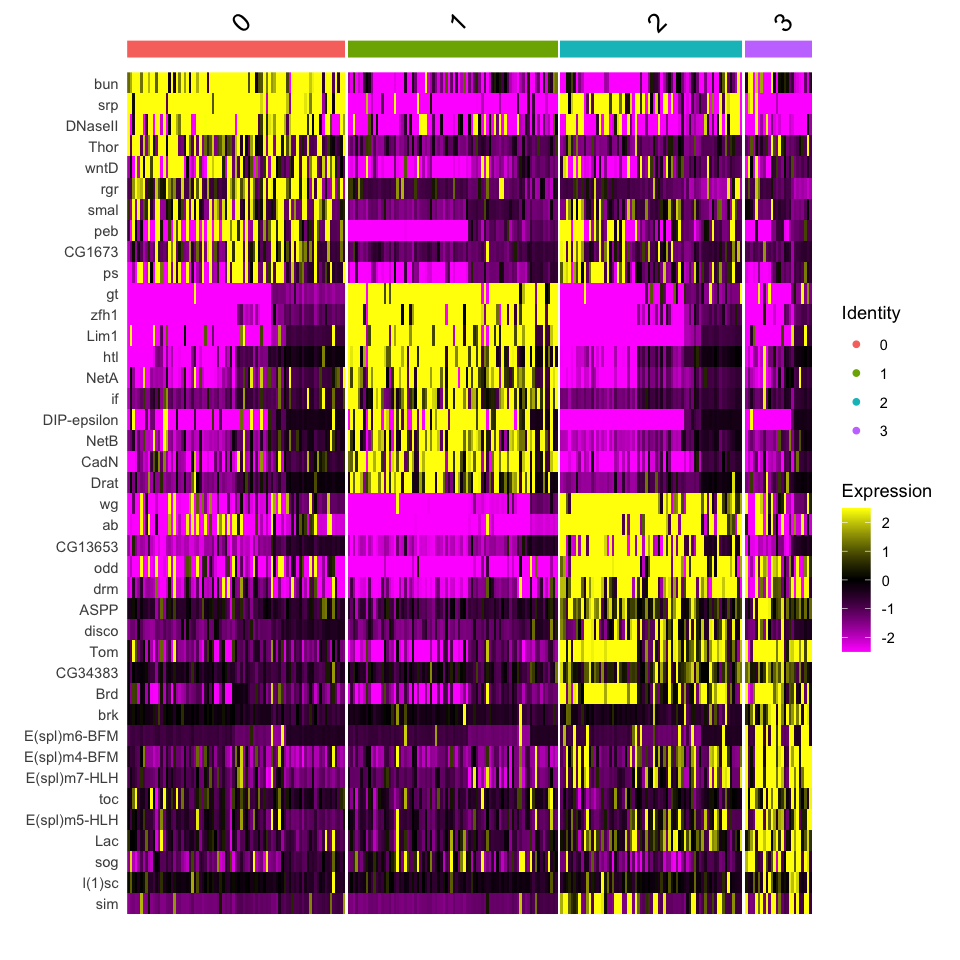

In [43]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DoHeatmap(seu.ant, features = c(all.markers.top10$gene))
fig

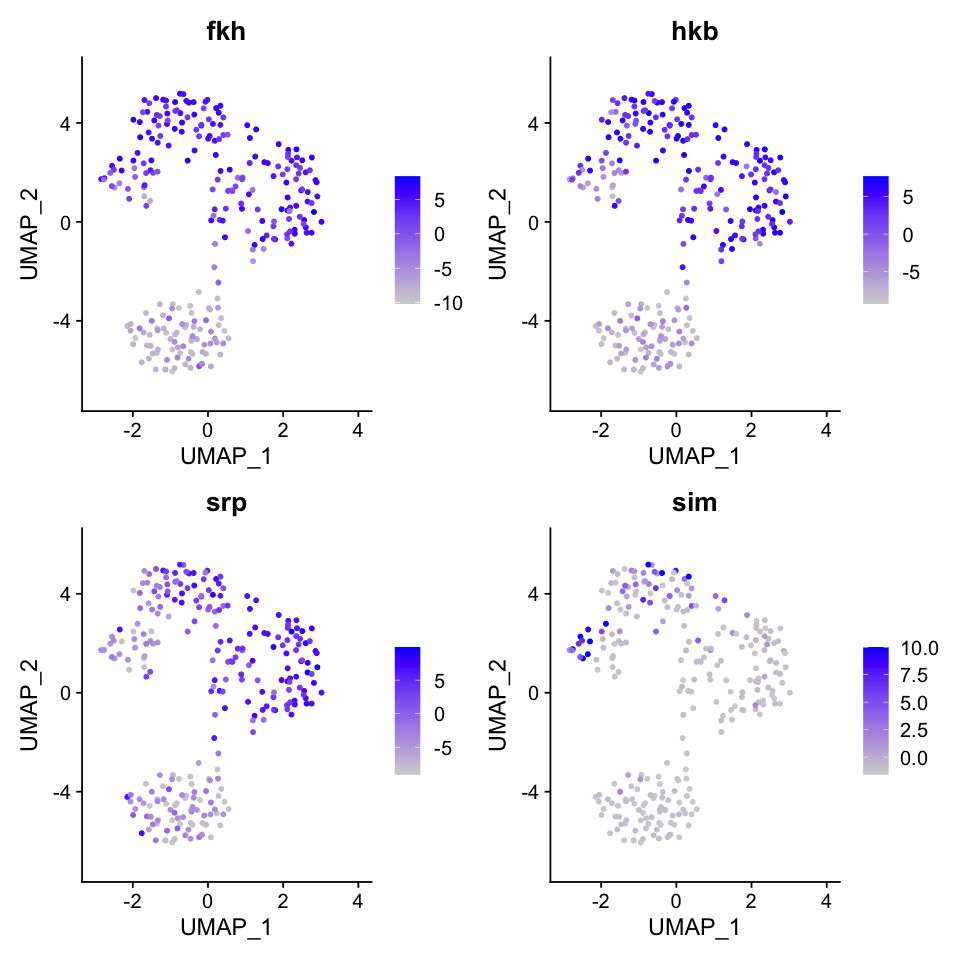

In [44]:
options(repr.plot.width=8, repr.plot.height=8)
FeaturePlot(seu.ant, reduction = "umap", features = c("fkh","hkb","srp","sim"), 
            pt.size = 1,  ncol = 2, slot = 'scale.data')

Cluster 4: Including The most anterior midline cells?
### Add annotation

,manual_ID
,<fct>
Set3_AAAGAACGTGTTCGTA,0
Set3_AACACACTCGTGGAAG,1
Set3_AACCTTTCACCCTCTA,0
Set3_AATGCCAAGTCAGGGT,1
Set3_ACACAGTAGAAGGATG,1
Set3_ACAGCCGGTTAGGCTT,3


,manual_ID
,<fct>
Set3_AAAGAACGTGTTCGTA,endoderm_antMG_wntD
Set3_AACACACTCGTGGAAG,mesoderm_head
Set3_AACCTTTCACCCTCTA,endoderm_antMG_wntD
Set3_AATGCCAAGTCAGGGT,mesoderm_head
Set3_ACACAGTAGAAGGATG,mesoderm_head
Set3_ACAGCCGGTTAGGCTT,endoderm_antMG_wg


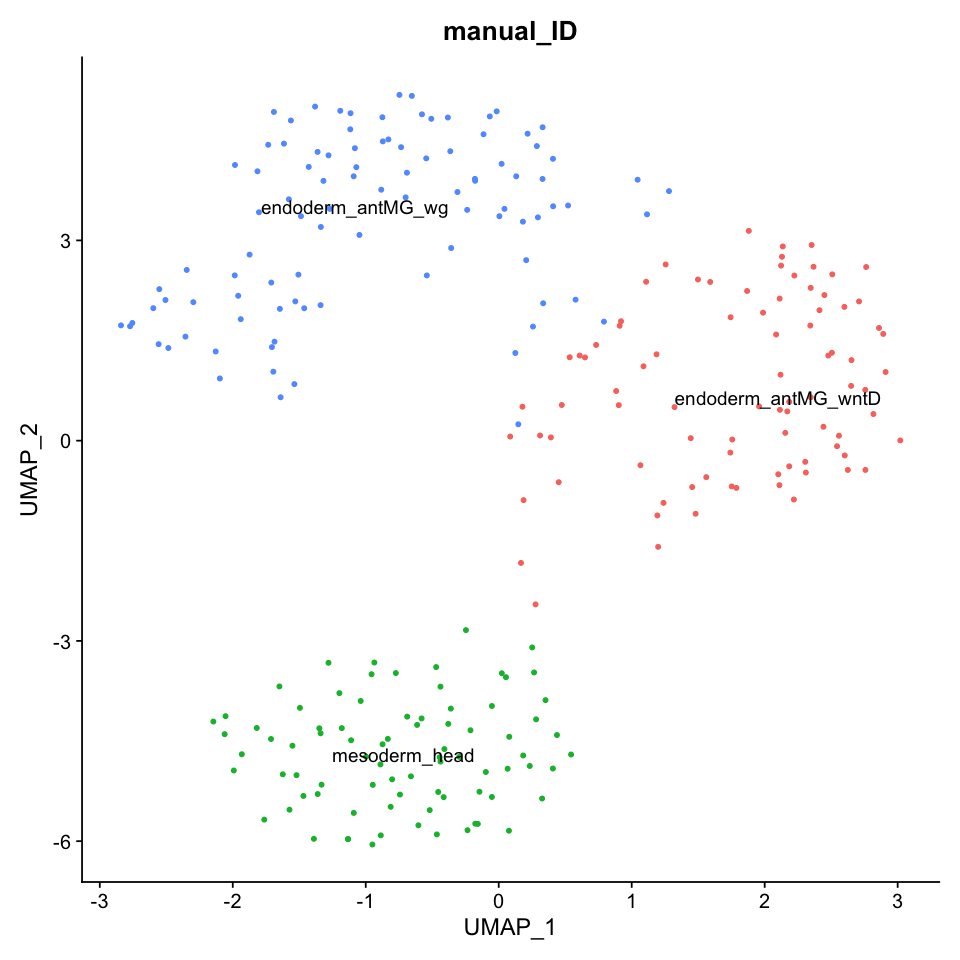

In [45]:
manual_id <- as.data.frame(seu.ant$seurat_clusters)
colnames(manual_id) <- c('manual_ID')
head(manual_id)
manual_id$manual_ID = dplyr::recode(manual_id$manual_ID, 
                                     "0"="endoderm_antMG_wntD", #fkh+, wntD, sna+, twi+
                                     "1"="mesoderm_head", #CadN+, sna+, twi+
                                     "2"="endoderm_antMG_wg", #fkh+
                                     "3"="endoderm_antMG_wg" #including sim+ cell（midline cells?） 
                                   )
                                    

head(manual_id)
seu.ant$manual_ID <- manual_id
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu.ant, reduction = 'umap', label = T, group.by = 'manual_ID') + NoLegend() 

In [46]:
Idents(seu.ant) <- 'manual_ID'
levels(seu.ant) <- c('mesoderm_head','endoderm_antMG_wntD','endoderm_antMG_wg')
all.markers <- FindAllMarkers(object = seu.ant, only.pos = TRUE)
nrow(all.markers)
all.markers.top10 <- all.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(all.markers.top10)

Calculating cluster mesoderm_head

Calculating cluster endoderm_antMG_wntD

Calculating cluster endoderm_antMG_wg



[1] 518

[1] 30

Saving 7 x 7 in image



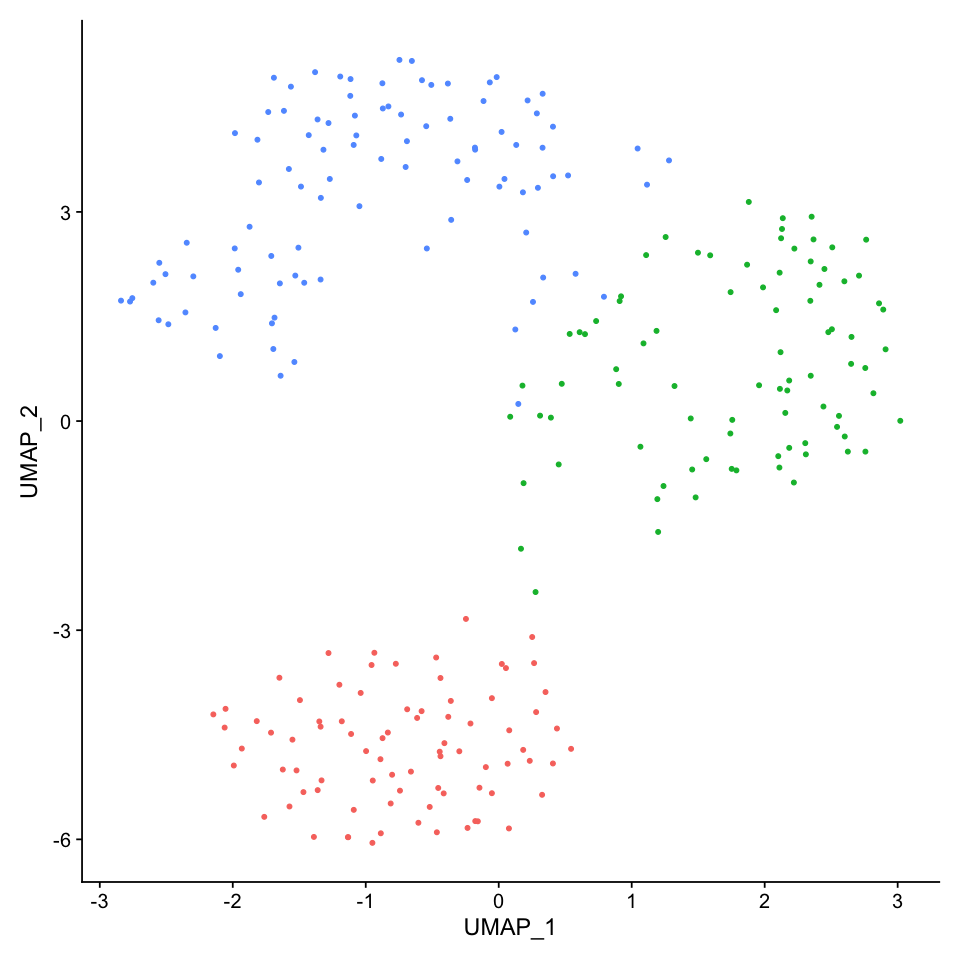

In [47]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu.ant, reduction =  "umap", label = FALSE) + NoLegend() 

fig
ggsave(fig, file = "./figures/04_meso_subclustering_integrate_all/meso_head_antMG_umap1.eps", dpi = 300)

Saving 7 x 7 in image



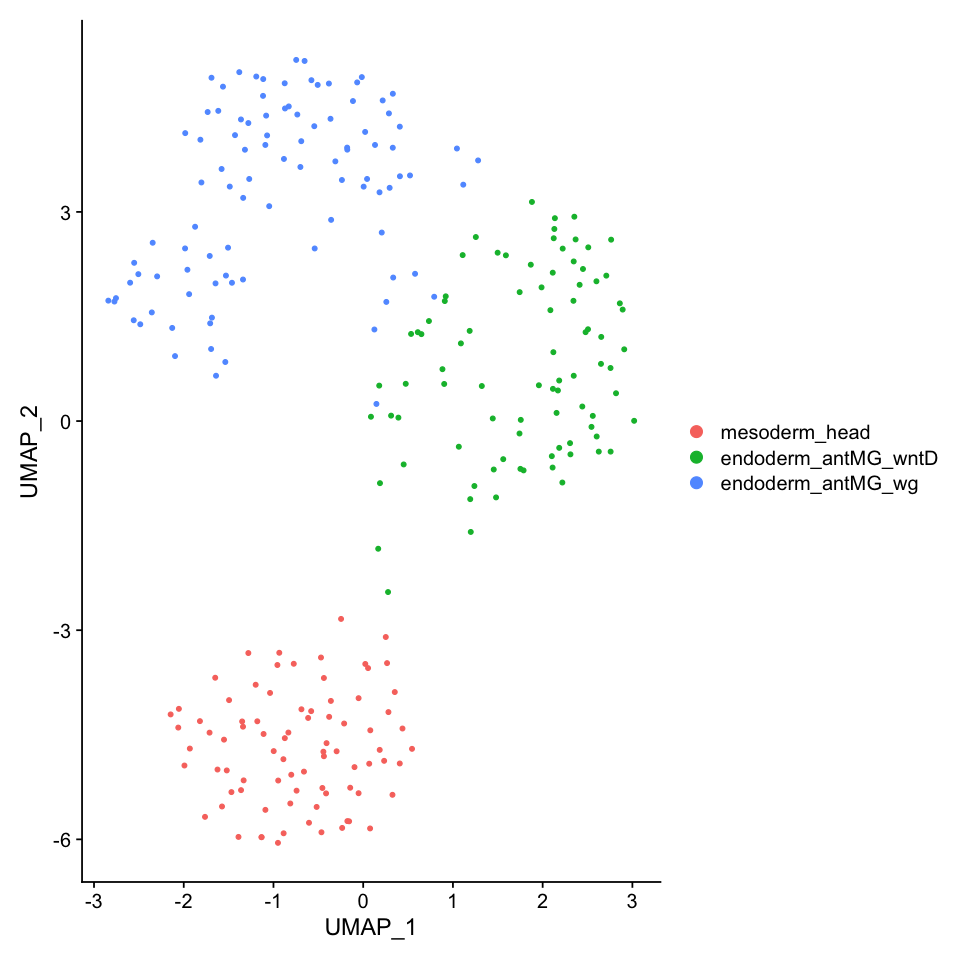

In [48]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu.ant, reduction =  "umap", label = FALSE) 

fig
ggsave(fig, file = "./figures/04_meso_subclustering_integrate_all/meso_head_antMG_umap2.eps", dpi = 300)

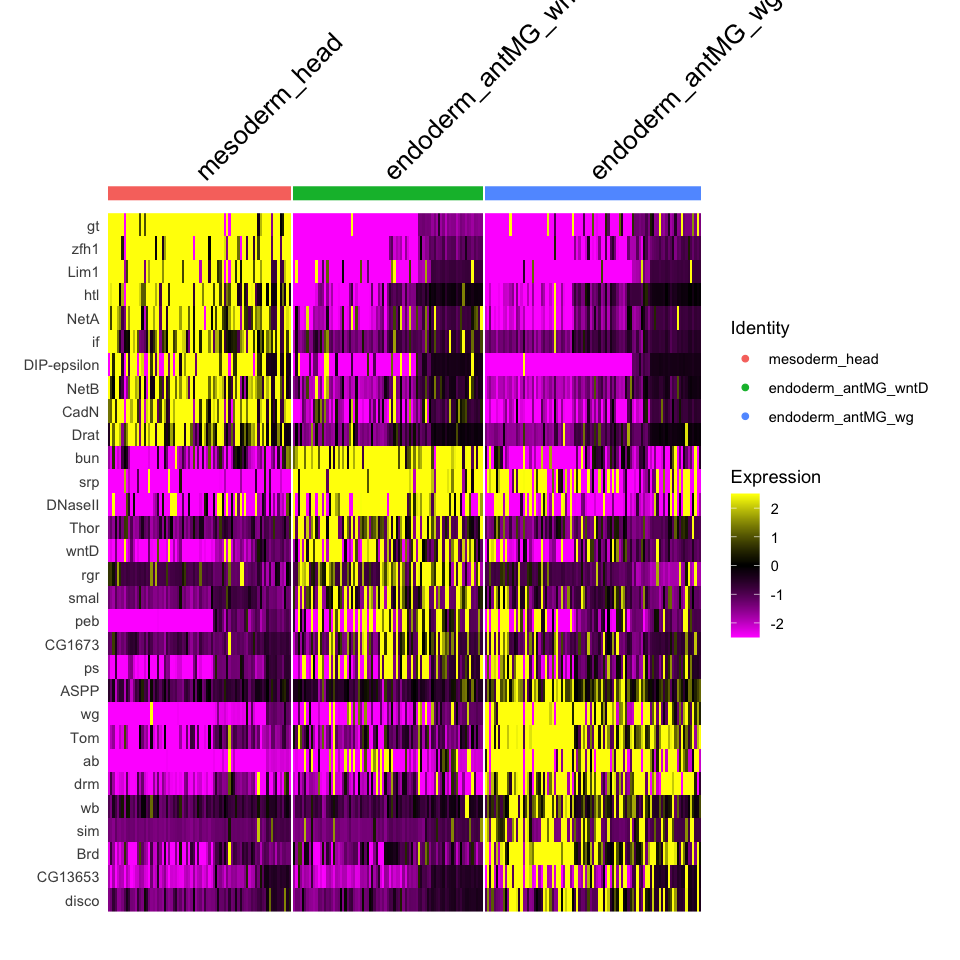

In [49]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DoHeatmap(seu.ant, features = c(all.markers.top10$gene))
fig
ggsave(fig, file = "./figures/04_meso_subclustering_integrate_all/meso_head_antMG_manualID_heatmap.eps", dpi = 300,  width = 12, height = 8)

## Mesoderm PS1–3
### Picking up target clusters

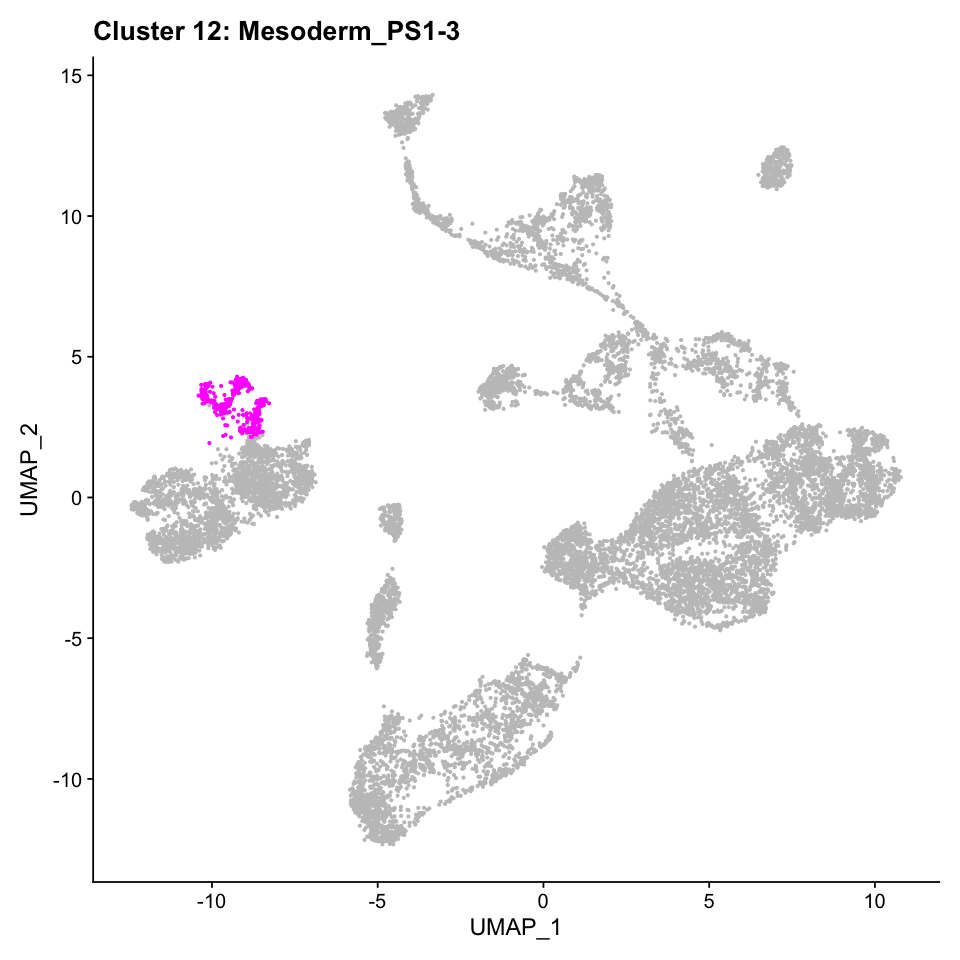

In [50]:
options(repr.plot.width=8, repr.plot.height=8)
highlight.cells <- WhichCells(seu_HQC,idents = c(12))
DimPlot(seu_HQC, reduction =  "umap", cells.highlight = highlight.cells, pt.size = 0.5, sizes.highlight = 0.5,
        cols.highlight = 'magenta', label = FALSE) + NoLegend()+ ggtitle('Cluster 12: Mesoderm_PS1-3')

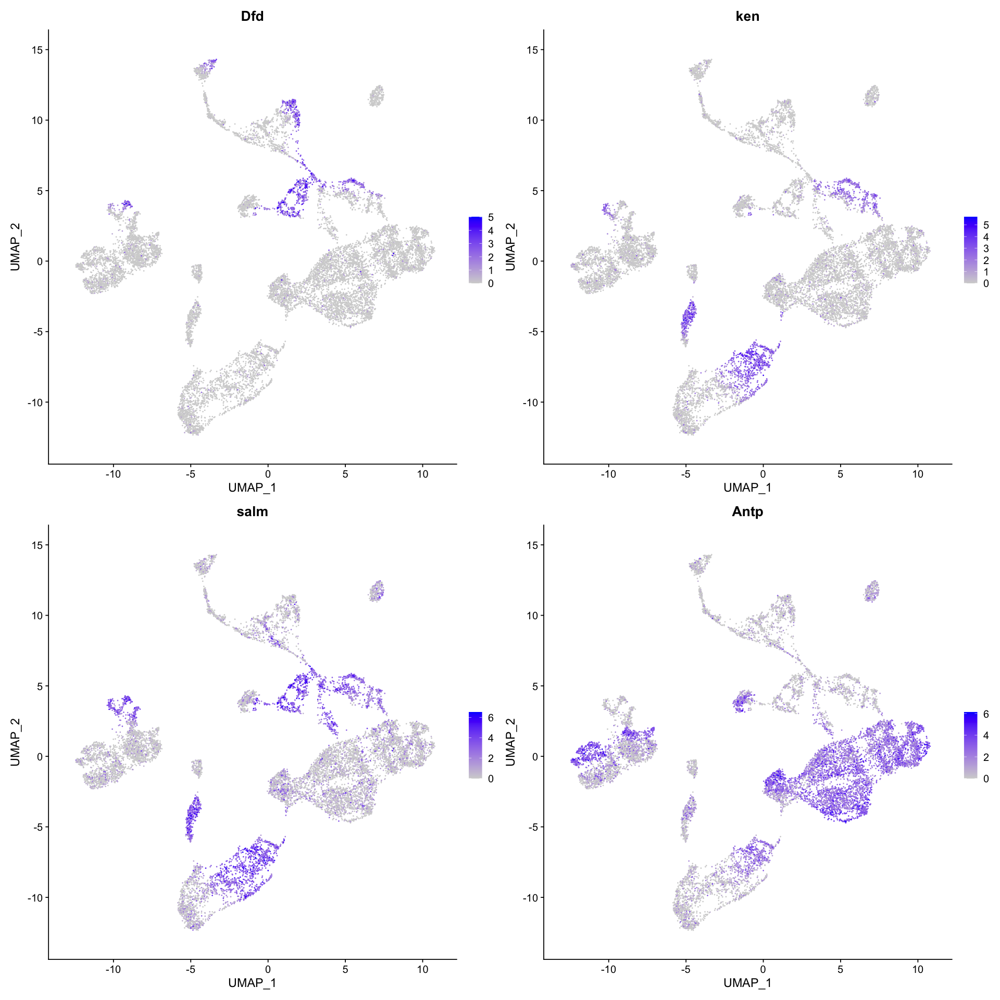

In [51]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu_HQC, reduction = 'umap', features = c('Dfd', 'ken', 'salm', 'Antp'))

In [52]:
seu.meso.ps1to3 <- subset(seu_HQC, ident = 12)
seu.meso.ps1to3

An object of class Seurat 
25136 features across 357 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

### Clustering

$`Set 3`
An object of class Seurat 
25136 features across 203 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

$`Set 2`
An object of class Seurat 
25136 features across 96 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

$`NK-data`
An object of class Seurat 
25136 features across 41 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

$`Set 1`
An object of class Seurat 
25136 features across 17 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony



Centering data matrix

Centering data matrix

Centering data matrix

Centering data matrix



$`Set 3`
An object of class Seurat 
25136 features across 203 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

$`Set 2`
An object of class Seurat 
25136 features across 96 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

$`NK-data`
An object of class Seurat 
25136 features across 41 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

$`Set 1`
An object of class Seurat 
25136 features across 17 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony



PC_ 1 
Positive:  Dfd, salm, gt, trn, edl, ken, CG17716, babos, CG4702, Blimp-1 
	   NetB, CG15628, px, ftz, noc, en, CG13427, bnl, mid, scrt 
	   CG10479, zfh1, D, rdx, rst, grim, Dl, CG10035, hh, chrb 
Negative:  ich, tsh, lncRNA:CR44931, Mef2, CG3036, CadN, CG7029, tin, emc, hll 
	   unc-5, lncRNA:CR45559, stg, CG14688, rgr, Toll-6, Kr, CG12177, hid, Cyp310a1 
	   rib, Mdr49, Nplp2, RapGAP1, Mes2, CG9005, stumps, shn, Mid1, mthl1 
PC_ 2 
Positive:  Dfd, gt, Toll-6, edl, zfh1, rpr, eve, run, ich, CG43658 
	   18w, wg, px, glec, CG17716, CG10479, Blimp-1, RhoL, emc, tsh 
	   shep, CG43394, rib, smal, rdx, otk, VepD, Dl, Imp-CR45204, GEFmeso 
Negative:  trn, CG4702, ken, tin, pri, chrb, scrt, pxb, ftz, Mdr49 
	   stg, lncRNA:CR44931, Pka-C3, mid, D, wntD, Desat1, sprt, Alp1, babos 
	   Myc, dally, NetA, CG7029, mthl1, Pvf3, GstT4, CG43355-sala, CG32447, beat-IIIc 
PC_ 3 
Positive:  ich, eve, ImpL2, CG13427, Tollo, CG10035, CG14915, pxb, CG34224, tsh 
	   sog, Atx-1, cv-2, mt:ATPase6, C

An object of class Seurat 
25136 features across 357 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 4 dimensional reductions calculated: pca, harmony, umap, umapwoharmony


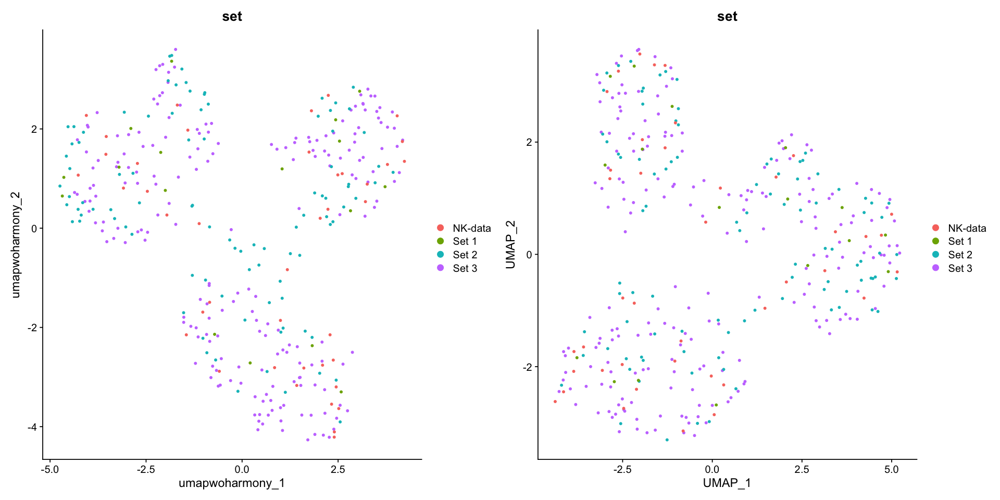

In [53]:
seu.meso.ps1to3 <- func.subclustering.prep(seu.meso.ps1to3)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 357
Number of edges: 20015

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.6265
Number of communities: 3
Elapsed time: 0 seconds


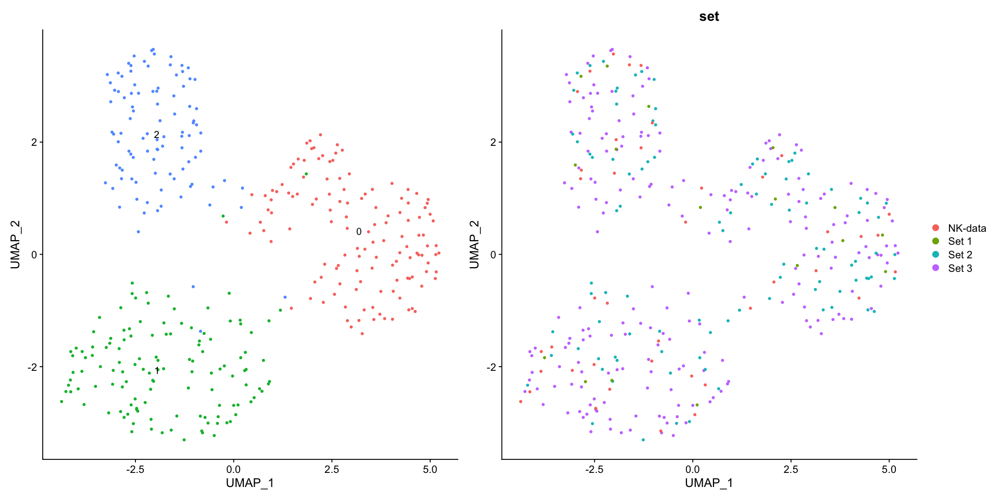

In [54]:
seu.meso.ps1to3 <- func.subclustering(seu.meso.ps1to3)

In [55]:
all.markers <- FindAllMarkers(object = seu.meso.ps1to3, only.pos = TRUE)
nrow(all.markers)
all.markers.top10 <- all.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(all.markers.top10)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2



[1] 167

[1] 30

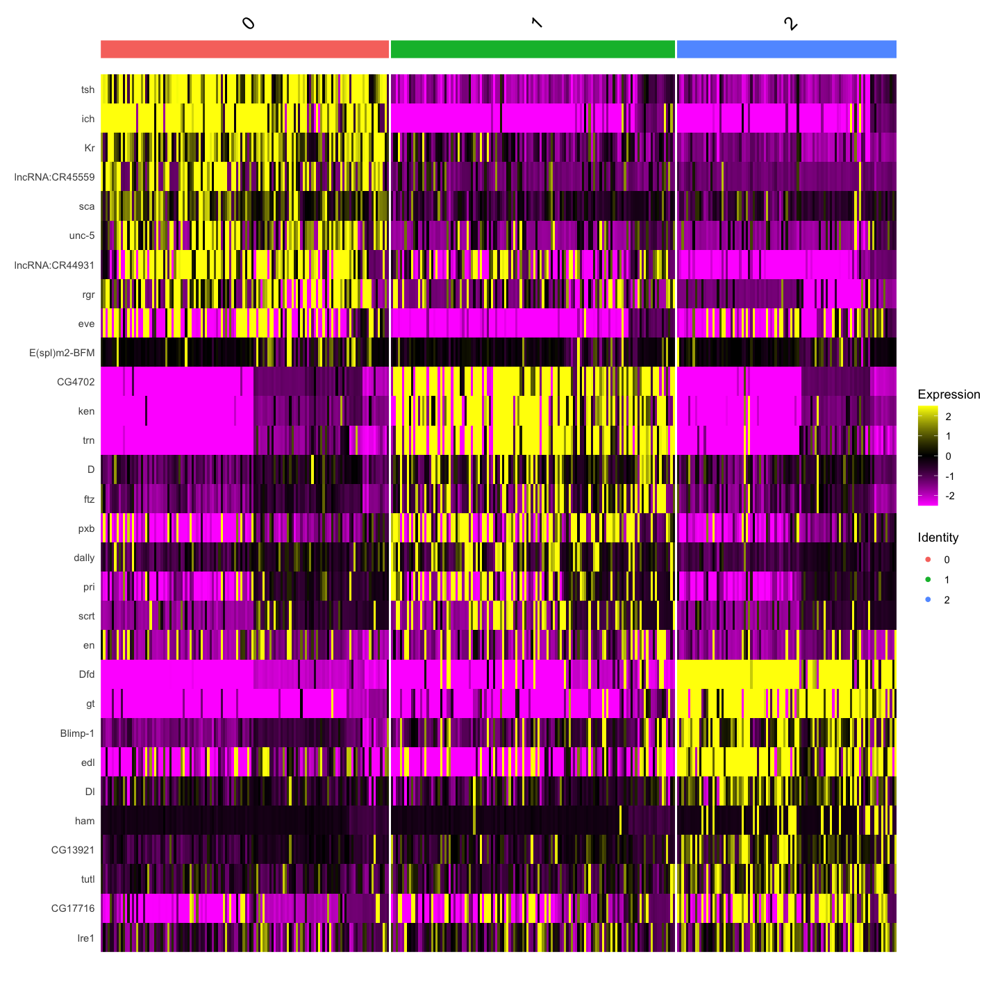

In [56]:
options(repr.plot.width=12, repr.plot.height=12)
DoHeatmap(seu.meso.ps1to3, features = c(all.markers.top10$gene))

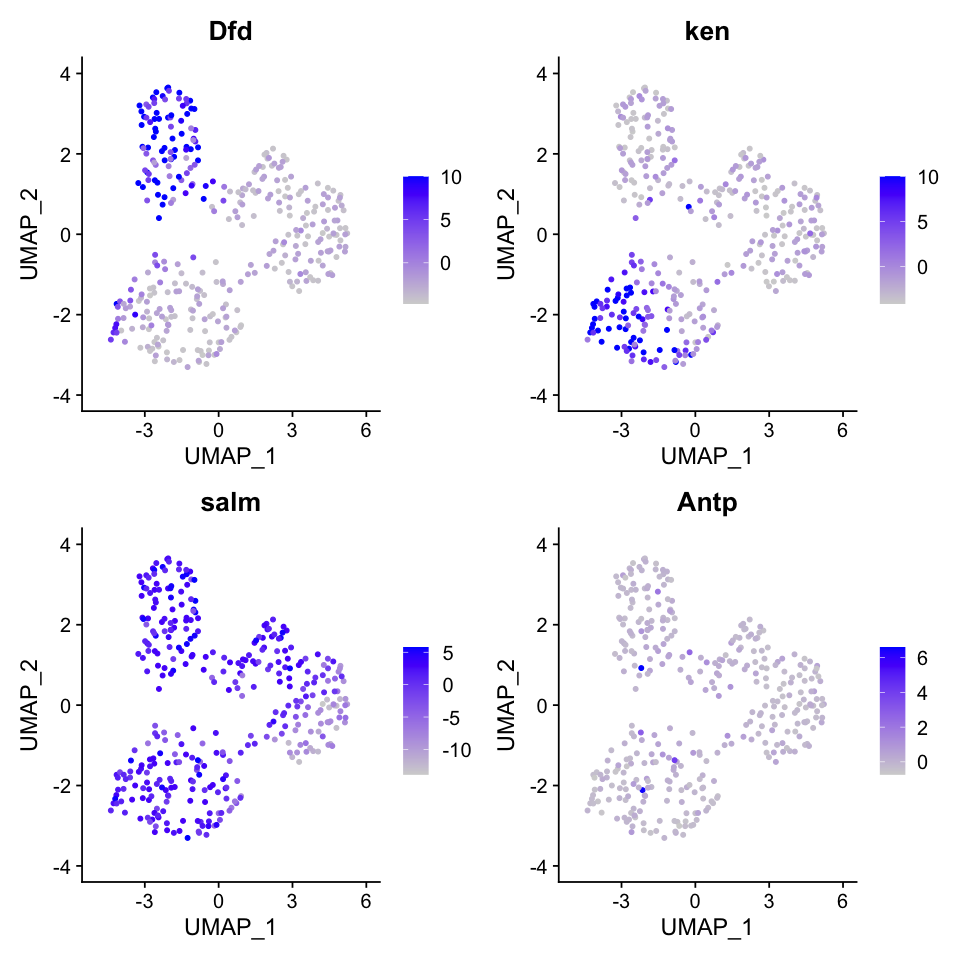

In [57]:
options(repr.plot.width=8, repr.plot.height=8)
FeaturePlot(seu.meso.ps1to3, reduction = 'umap', features = c('Dfd', 'ken','salm','Antp'), slot='scale.data')

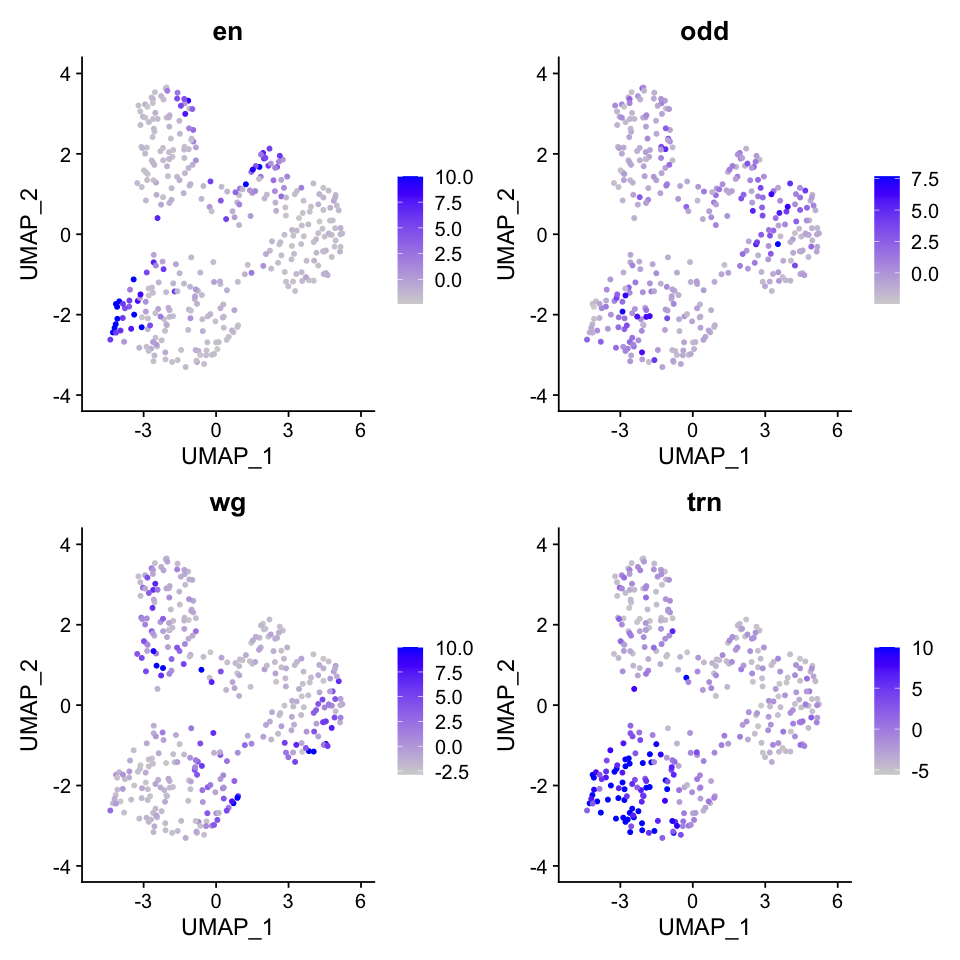

In [58]:
options(repr.plot.width=8, repr.plot.height=8)
FeaturePlot(seu.meso.ps1to3, reduction = 'umap', features = c('en', 'odd','wg','trn'), slot='scale.data')

### Add annotation

,manual_ID
,<fct>
Set3_AAAGGATCACTTGAAC,2
Set3_AAGCATCAGCTAAATG,2
Set3_AAGGAATGTACTGGGA,1
Set3_AATAGAGCAAGTATAG,1
Set3_AATCACGCAGGTACGA,1
Set3_AATCGACCACCTGTCT,1


,manual_ID
,<fct>
Set3_AAAGGATCACTTGAAC,mesoderm_PS1_Dfd
Set3_AAGCATCAGCTAAATG,mesoderm_PS1_Dfd
Set3_AAGGAATGTACTGGGA,mesoderm_PS2_ken
Set3_AATAGAGCAAGTATAG,mesoderm_PS2_ken
Set3_AATCACGCAGGTACGA,mesoderm_PS2_ken
Set3_AATCGACCACCTGTCT,mesoderm_PS2_ken


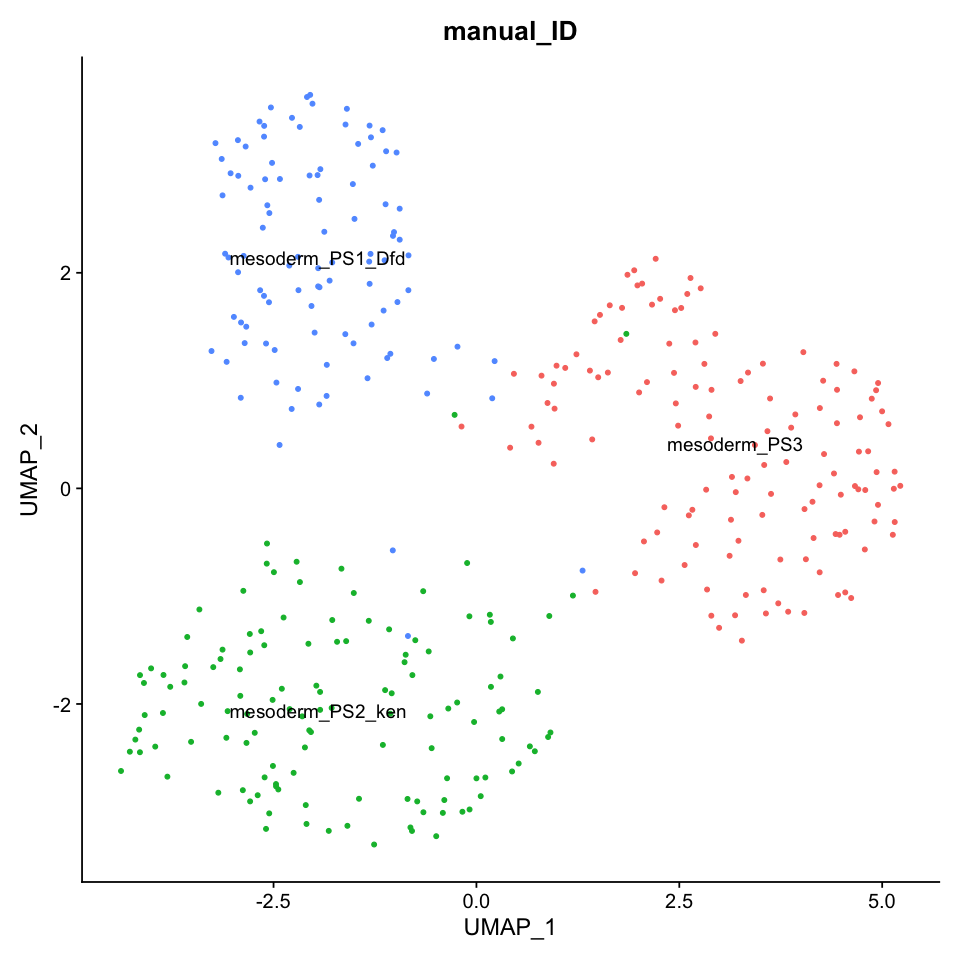

In [59]:
manual_id <- as.data.frame(seu.meso.ps1to3$seurat_clusters)
colnames(manual_id) <- c('manual_ID')
head(manual_id)
manual_id$manual_ID = dplyr::recode(manual_id$manual_ID, 
                                     "0"="mesoderm_PS3", 
                                     "1"="mesoderm_PS2_ken",
                                     "2"="mesoderm_PS1_Dfd",
                                   )
                                    

head(manual_id)
seu.meso.ps1to3$manual_ID <- manual_id
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu.meso.ps1to3, reduction = 'umap', label = T, group.by = 'manual_ID') + NoLegend() 

In [60]:
Idents(seu.meso.ps1to3) <- 'manual_ID'
levels(seu.meso.ps1to3) <- c('mesoderm_PS1_Dfd','mesoderm_PS2_ken','mesoderm_PS3')
all.markers <- FindAllMarkers(object = seu.meso.ps1to3, only.pos = TRUE)
nrow(all.markers)
all.markers.top10 <- all.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(all.markers.top10)

Calculating cluster mesoderm_PS1_Dfd

Calculating cluster mesoderm_PS2_ken

Calculating cluster mesoderm_PS3



[1] 167

[1] 30

Saving 7 x 7 in image



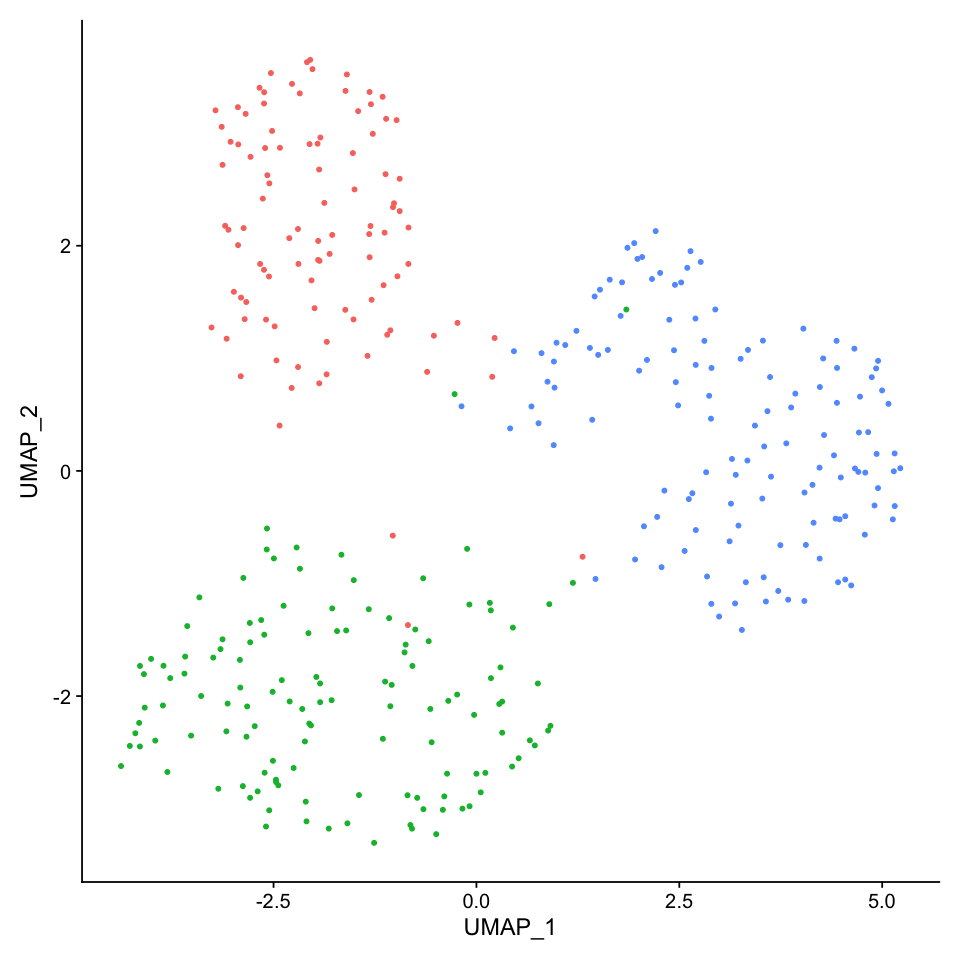

In [61]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu.meso.ps1to3, reduction =  "umap", label = FALSE) + NoLegend() 

fig
ggsave(fig, file = "./figures/04_meso_subclustering_integrate_all/meso_PS1-3_umap1.eps", dpi = 300)

Saving 7 x 7 in image



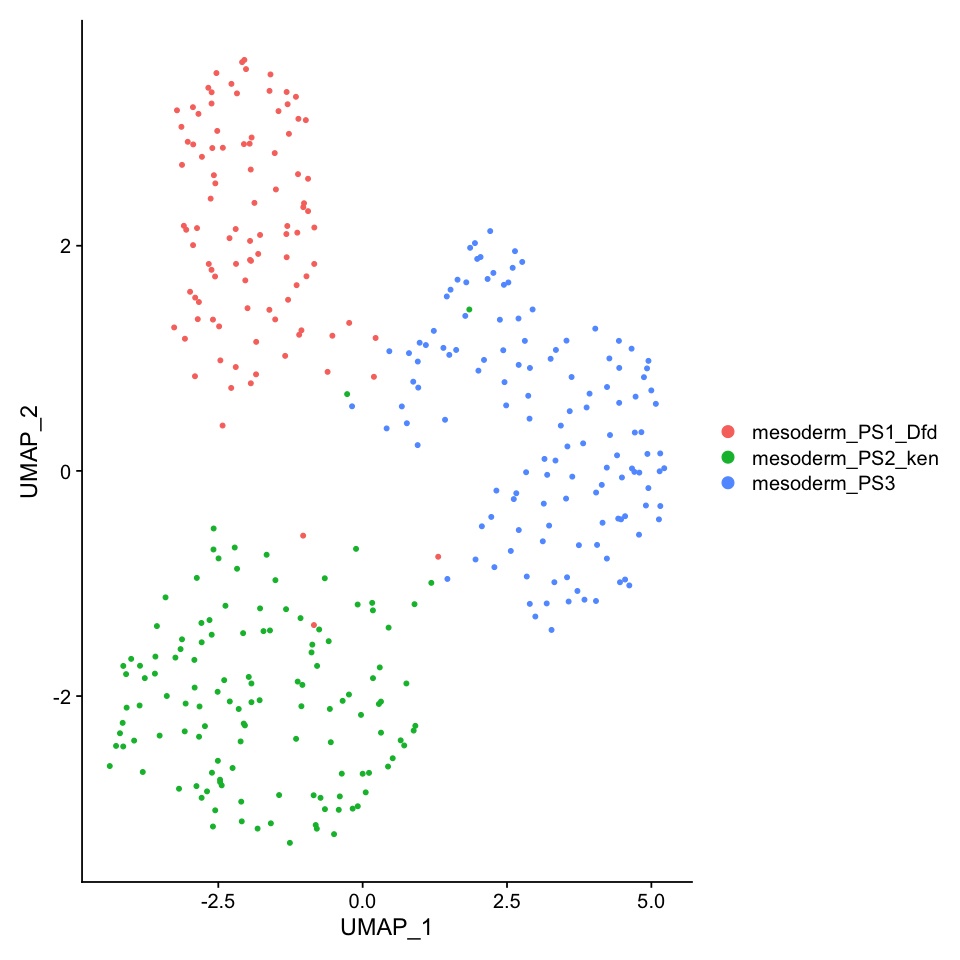

In [62]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu.meso.ps1to3, reduction =  "umap", label = FALSE)

fig
ggsave(fig, file = "./figures/04_meso_subclustering_integrate_all/meso_PS1-3_umap2.eps", dpi = 300)

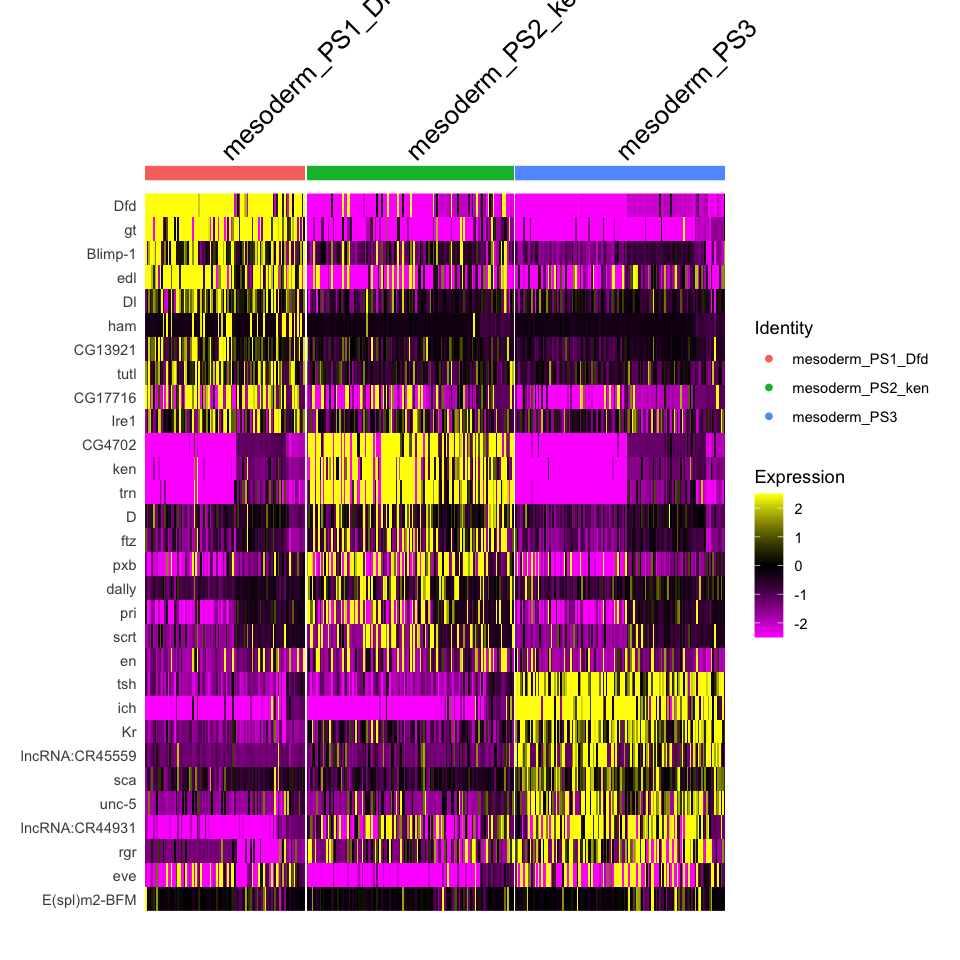

In [63]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DoHeatmap(seu.meso.ps1to3, features = c(all.markers.top10$gene))
fig
ggsave(fig, file = "./figures/04_meso_subclustering_integrate_all/meso_PS1-3_manualID_heatmap.eps", dpi = 300,  width = 12, height = 8)

## Mesoderm PS13
### picking up target clusters

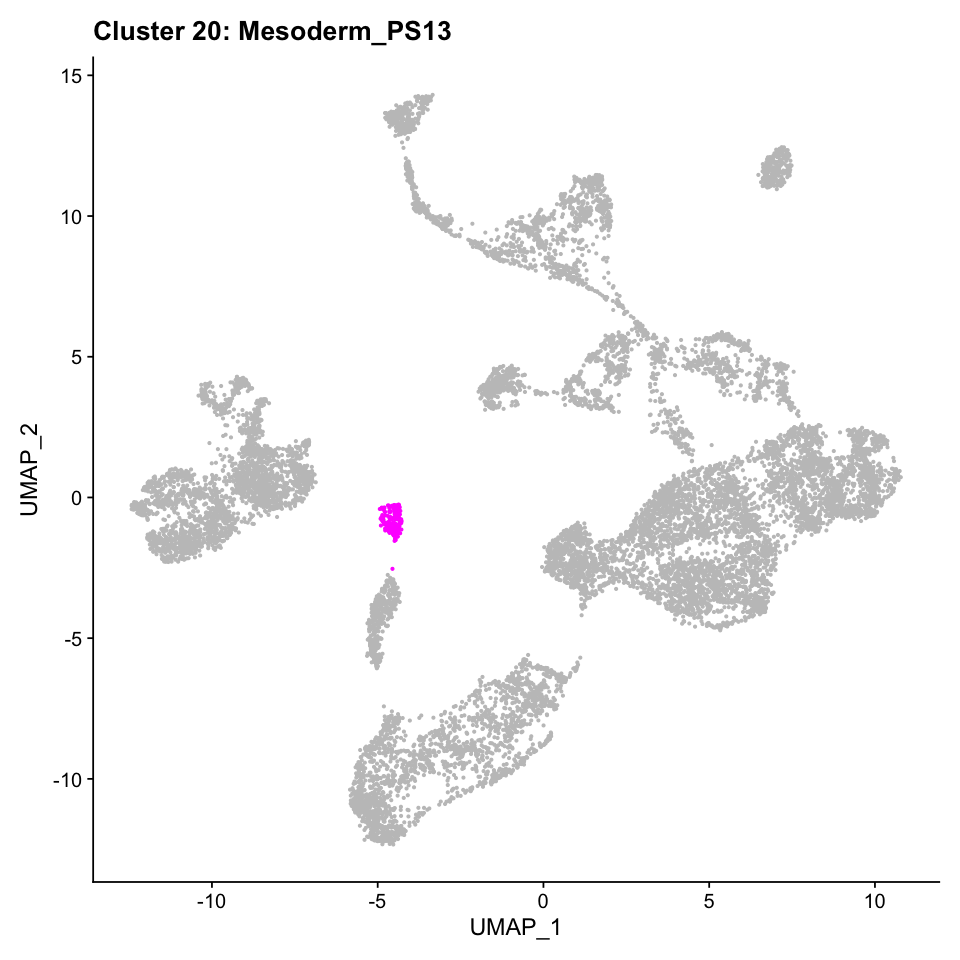

In [64]:
options(repr.plot.width=8, repr.plot.height=8)
highlight.cells <- WhichCells(seu_HQC,idents = c(20))
DimPlot(seu_HQC, reduction =  "umap", cells.highlight = highlight.cells, pt.size = 0.5, sizes.highlight = 0.5,
        cols.highlight = 'magenta', label = FALSE) + NoLegend()+ ggtitle('Cluster 20: Mesoderm_PS13')

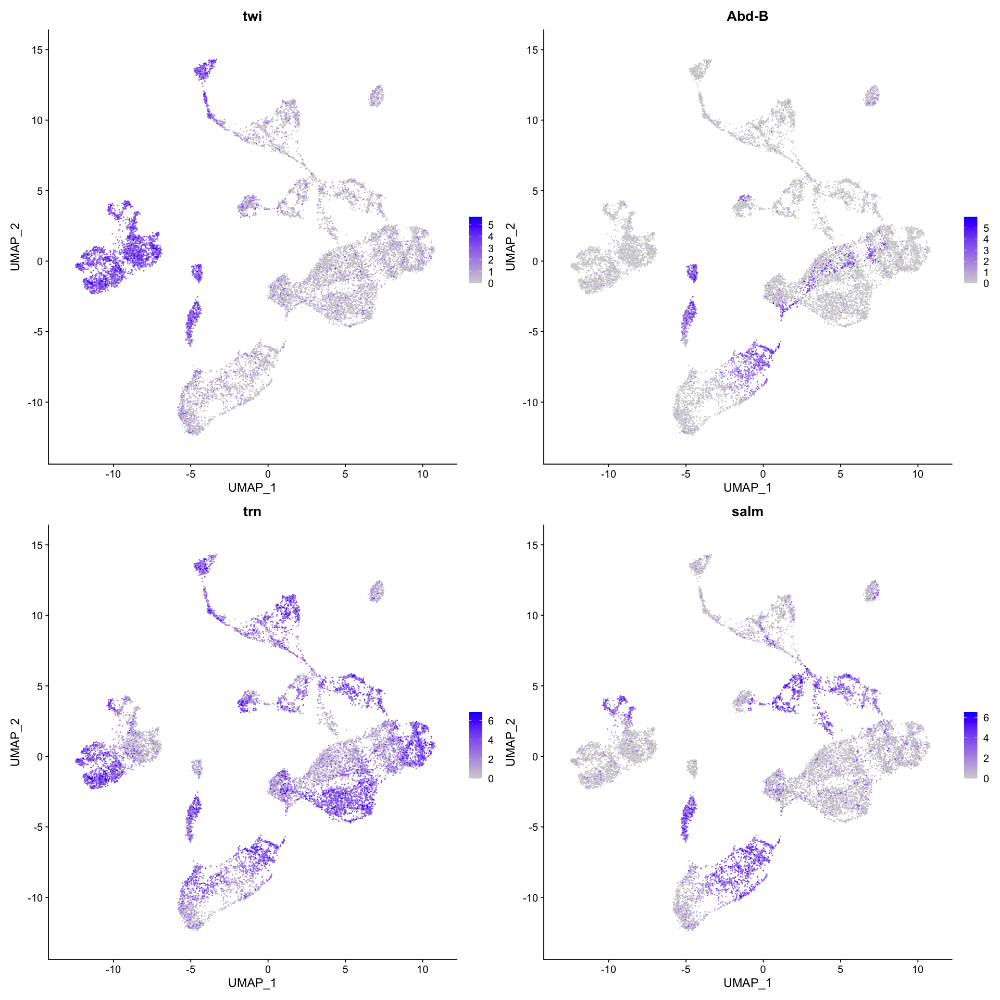

In [65]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu_HQC, reduction = 'umap', features = c('twi', 'Abd-B', 'trn', 'salm'))

In [66]:
seu.meso.ps13 <- subset(seu_HQC, ident = 20)
seu.meso.ps13

An object of class Seurat 
25136 features across 199 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

### Clustering

$`Set 3`
An object of class Seurat 
25136 features across 114 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

$`Set 2`
An object of class Seurat 
25136 features across 57 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

$`NK-data`
An object of class Seurat 
25136 features across 20 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

$`Set 1`
An object of class Seurat 
25136 features across 8 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony



Centering data matrix

Centering data matrix

Centering data matrix

Centering data matrix



$`Set 3`
An object of class Seurat 
25136 features across 114 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

$`Set 2`
An object of class Seurat 
25136 features across 57 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

$`NK-data`
An object of class Seurat 
25136 features across 20 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

$`Set 1`
An object of class Seurat 
25136 features across 8 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony



PC_ 1 
Positive:  eve, Tollo, hh, pxb, en, pri, mid, DIP-epsilon, h, lncRNA:bxd 
	   Ilp4, kibra, Pka-C3, abd-A, rdx, hth, lncRNA:CR43617, Six4, pigs, Ubx 
	   sty, p130CAS, IRSp53, CG14688, CG6398, gsb, Alh, NetB, px, scyl 
Negative:  run, SNCF, rib, lncRNA:iab8, VepD, Blimp-1, FoxL1, comm, scrt, hll 
	   Toll-6, Nplp2, wntD, tin, zfh1, 18w, CG42762, mthl1, CG17265, emc 
	   Mid1, CG3036, Mef2, CG13248, Act87E, CG13101, rhea, twi, CG9171, rst 
PC_ 2 
Positive:  hll, eve, Mef2, twi, stg, CG3036, CG12177, stumps, CadN, rib 
	   Mes2, Act87E, tin, Cyp310a1, emc, sty, CG7029, CG14688, mthl1, DIP-epsilon 
	   Pka-C3, Six4, Ilp4, sna, zfh1, htl, Tis11, kibra, Traf4, VepD 
Negative:  wntD, CG13427, ImpL2, CG10035, run, CG12986, Atx-1, CG42762, RpLP1, cv-2 
	   CG43394, CG34224, RpL7, sog, Dl, Lac, RpL27A, RpS11, crb, grh 
	   CG15628, Dtg, Doc1, tup, RpS20, SoxN, aop, RpS18, mt:Cyt-b, RpS15 
PC_ 3 
Positive:  CadN, lncRNA:iab8, Nrt, htl, lncRNA:roX1, lncRNA:CR45361, robo2, Ten-a, lncRNA:Hsro

An object of class Seurat 
25136 features across 199 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 4 dimensional reductions calculated: pca, harmony, umap, umapwoharmony


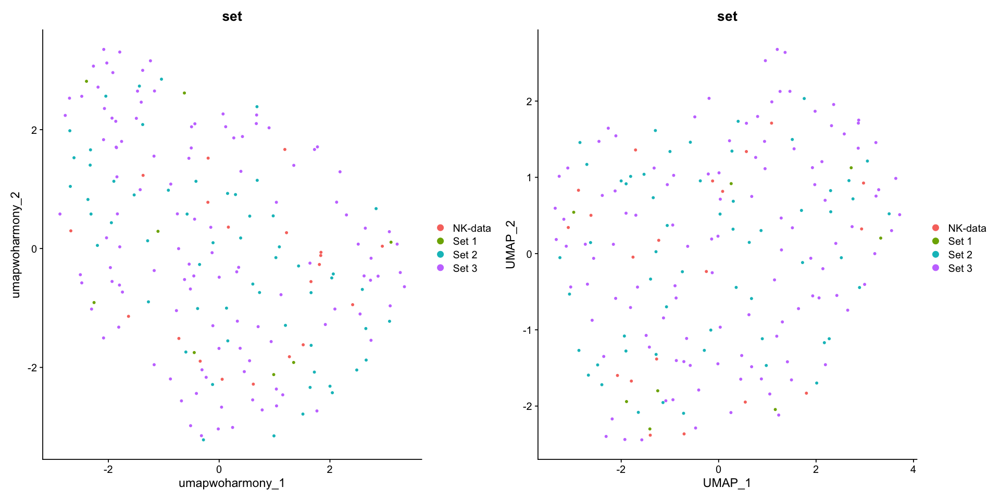

In [67]:
seu.meso.ps13 <- func.subclustering.prep(seu.meso.ps13)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 199
Number of edges: 16631

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.2578
Number of communities: 2
Elapsed time: 0 seconds


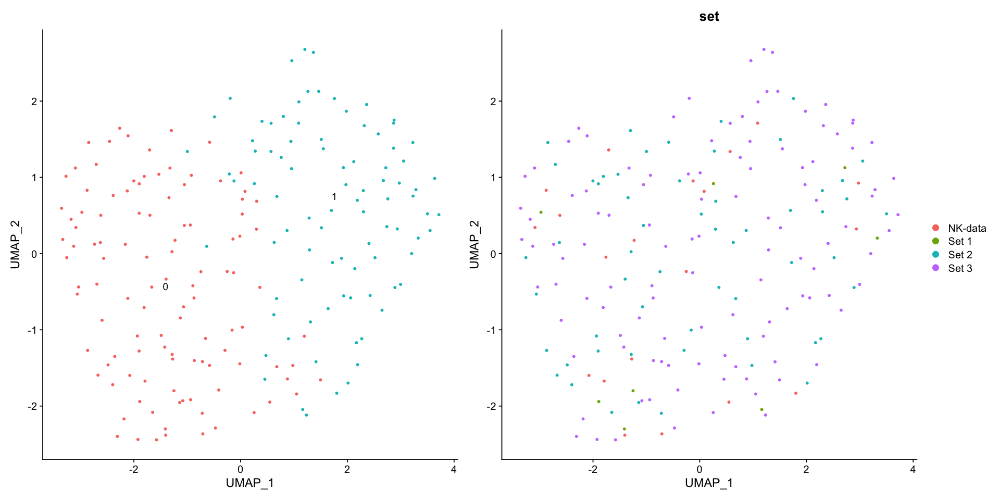

In [68]:
seu.meso.ps13 <- func.subclustering(seu.meso.ps13)

In [69]:
all.markers <- FindAllMarkers(object = seu.meso.ps13, only.pos = TRUE)
nrow(all.markers)
all.markers.top10 <- all.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(all.markers.top10)

Calculating cluster 0

Calculating cluster 1



[1] 111

[1] 20

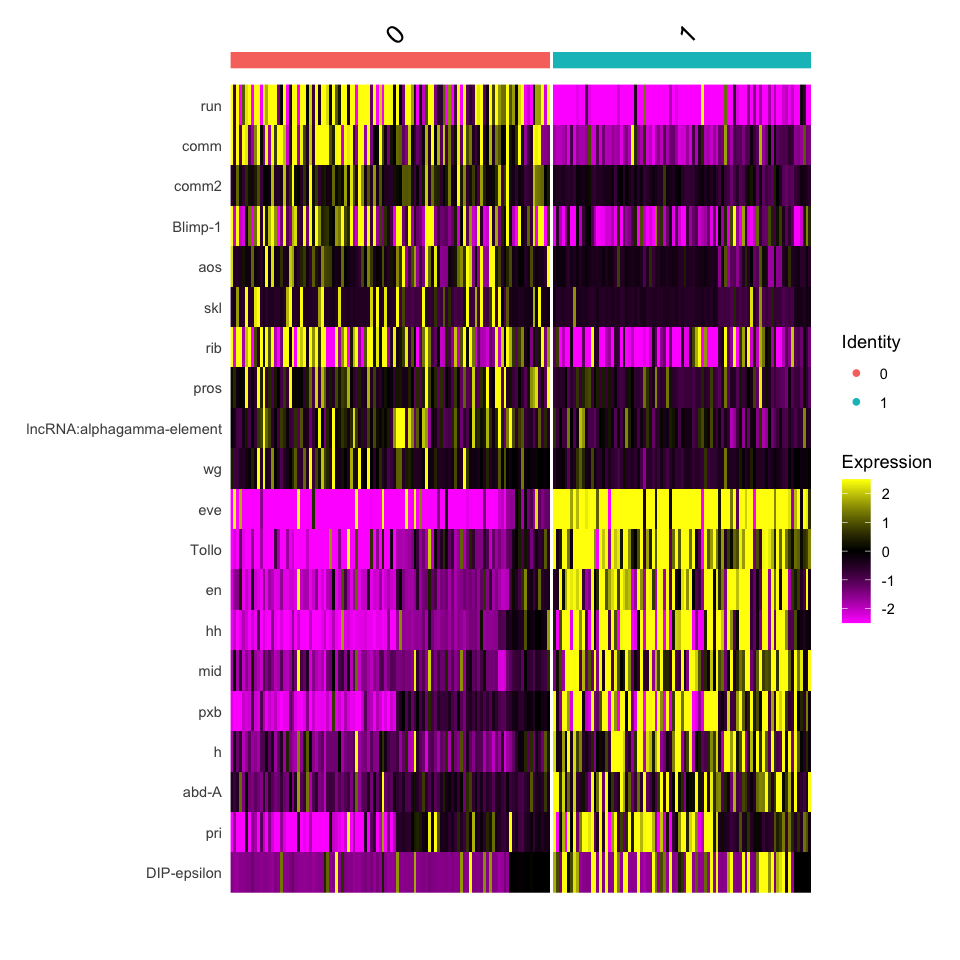

In [70]:
options(repr.plot.width=8, repr.plot.height=8)
DoHeatmap(seu.meso.ps13, features = c(all.markers.top10$gene))

Anterior/Posterior in the parasegment

In [71]:
seu.meso.ps13$manual_ID <- 'mesoderm_PS13'

## Posterior mesoderm
### Picking up target clusters

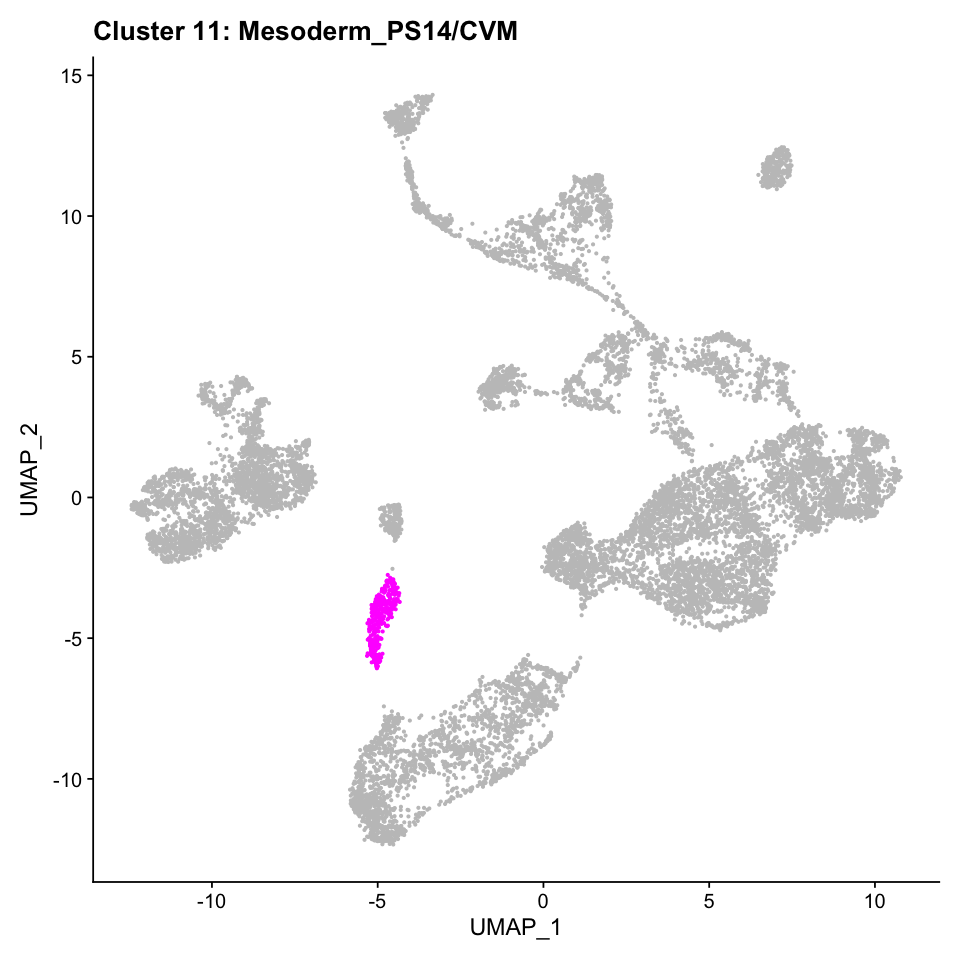

In [72]:
options(repr.plot.width=8, repr.plot.height=8)
highlight.cells <- WhichCells(seu_HQC,idents = c(11))
DimPlot(seu_HQC, reduction =  "umap", cells.highlight = highlight.cells, pt.size = 0.5, sizes.highlight = 0.5,
        cols.highlight = 'magenta', label = FALSE) + NoLegend()+ ggtitle('Cluster 11: Mesoderm_PS14/CVM')

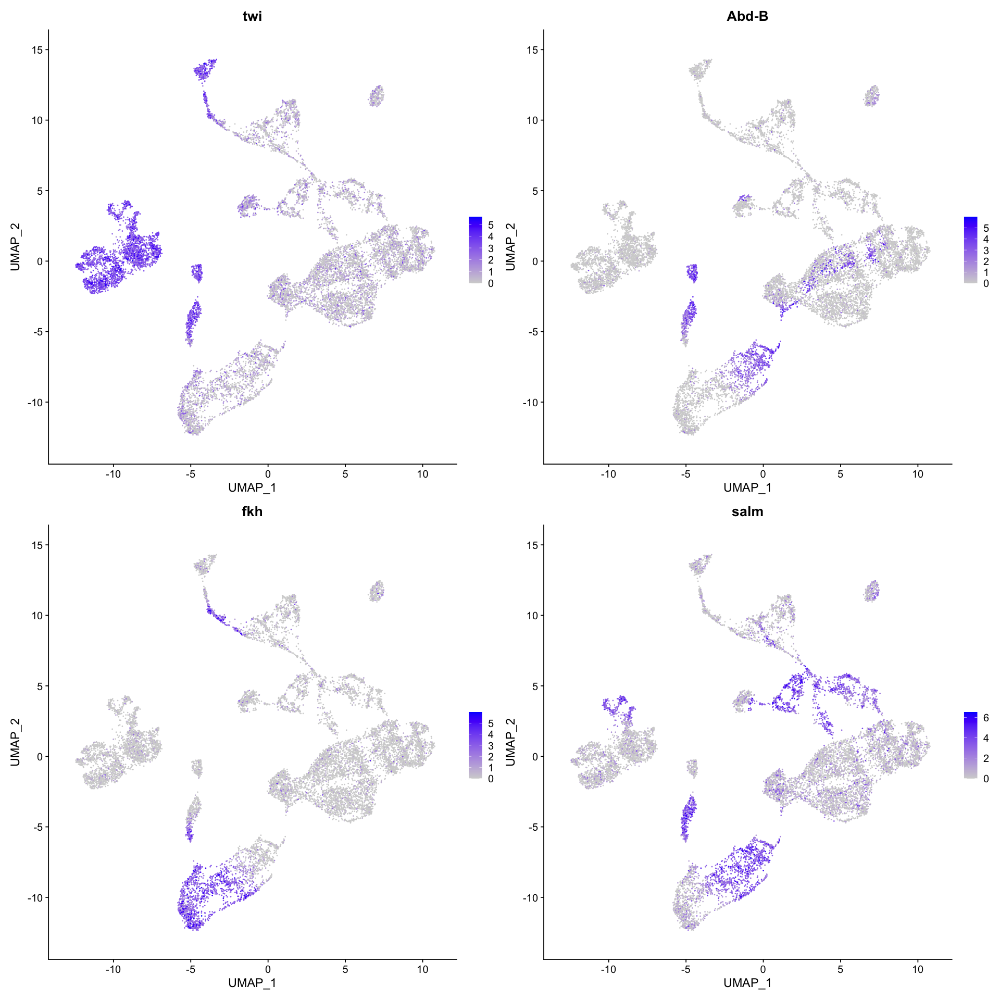

In [73]:
options(repr.plot.width=16, repr.plot.height=16)
FeaturePlot(seu_HQC, reduction = 'umap', features = c('twi', 'Abd-B', 'fkh', 'salm'))

In [74]:
seu.meso.ps14 <- subset(seu_HQC, ident = 11)
seu.meso.ps14

An object of class Seurat 
25136 features across 368 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

### Clustering

$`Set 3`
An object of class Seurat 
25136 features across 206 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

$`Set 2`
An object of class Seurat 
25136 features across 108 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

$`NK-data`
An object of class Seurat 
25136 features across 27 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

$`Set 1`
An object of class Seurat 
25136 features across 27 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony



Centering data matrix

Centering data matrix

Centering data matrix

Centering data matrix



$`Set 3`
An object of class Seurat 
25136 features across 206 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

$`Set 2`
An object of class Seurat 
25136 features across 108 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

$`NK-data`
An object of class Seurat 
25136 features across 27 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony

$`Set 1`
An object of class Seurat 
25136 features across 27 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, harmony



PC_ 1 
Positive:  ftz, Abd-B, D, ken, Blimp-1, trn, Oatp74D, twi, hb, lncRNA:iab8 
	   CadN, NetA, htl, ich, cad, SNCF, wb, dpn, Mef2, prd 
	   chrb, Ama, ptc, FoxL1, Cyp310a1, if, salm, fd96Cb, wech, sprt 
Negative:  HLH54F, fkh, wg, GlcAT-P, byn, Gmap, Fas2, Sema5c, disco, Notum 
	   rib, luna, CG5002, noc, so, CG2930, CG7029, 18w, Ndae1, Nplp2 
	   CG16758, CG3036, bun, bowl, CG43658, cv-c, apt, CG45050-CG43675, tll, srp 
PC_ 2 
Positive:  disco, dpn, rib, fd96Cb, cad, byn, DIP-epsilon, beat-IIIc, h, ken 
	   zfh1, wb, D, klg, salm, bab2, CG7029, MESR3, twi, Blimp-1 
	   CG43355-sala, pxb, CG42342, sna, CG31871, Mef2, CadN, lncRNA:iab8, wg, NetA 
Negative:  ich, ftz, sprt, hh, tin, en, opa, run, FoxL1, prd 
	   tsh, pigs, mid, htl, odd, scrt, fkh, Oatp74D, SNCF, bun 
	   fz2, tkv, hll, Gmap, comm, 18w, hth, wntD, dan, toc 
PC_ 3 
Positive:  hll, CadN, Mef2, VepD, zfh1, ich, Mes2, sprt, FoxL1, htl 
	   mthl1, CG3036, twi, stumps, Nplp2, CG7029, GlcAT-P, 18w, CG12177, Oatp74D 
	   be,

An object of class Seurat 
25136 features across 368 samples within 2 assays 
Active assay: SCT (12568 features, 3000 variable features)
 1 other assay present: RNA
 4 dimensional reductions calculated: pca, harmony, umap, umapwoharmony


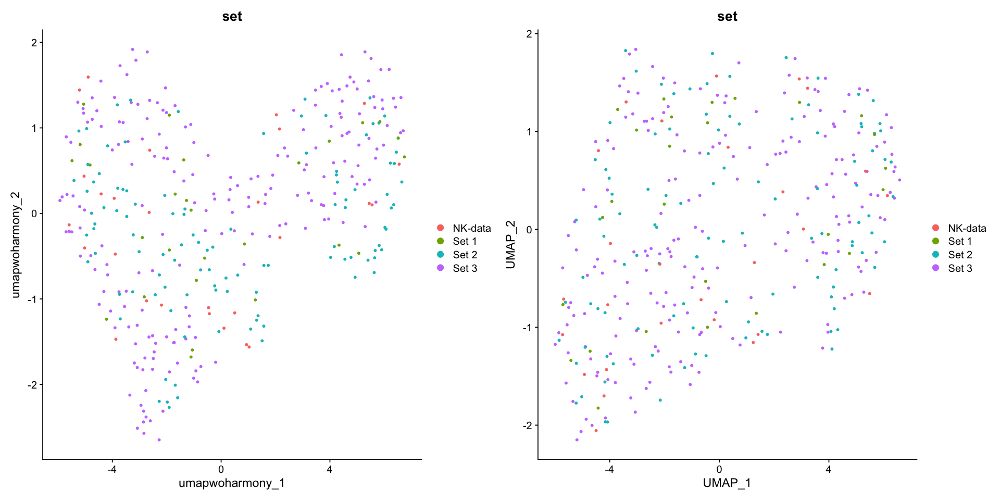

In [75]:
seu.meso.ps14 <- func.subclustering.prep(seu.meso.ps14)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 368
Number of edges: 23911

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.5219
Number of communities: 3
Elapsed time: 0 seconds


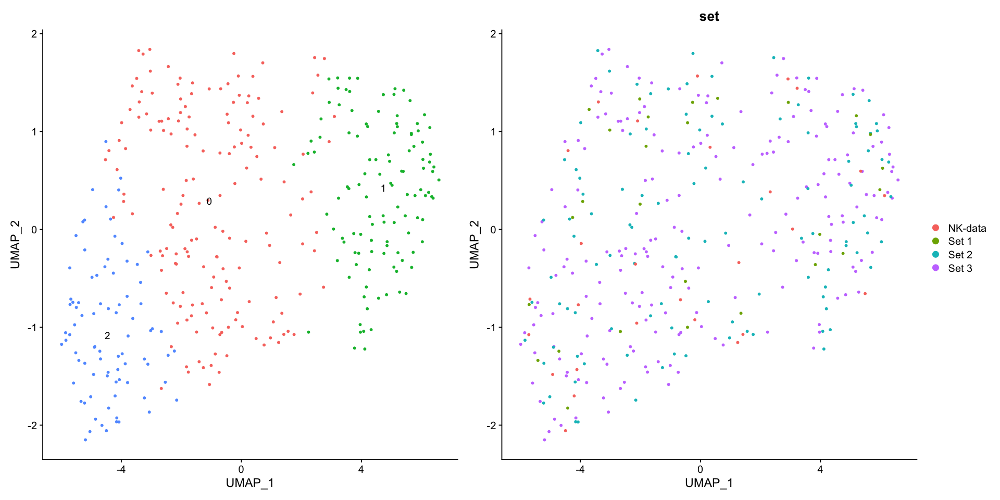

In [76]:
seu.meso.ps14 <- func.subclustering(seu.meso.ps14)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 368
Number of edges: 23911

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.3755
Number of communities: 4
Elapsed time: 0 seconds


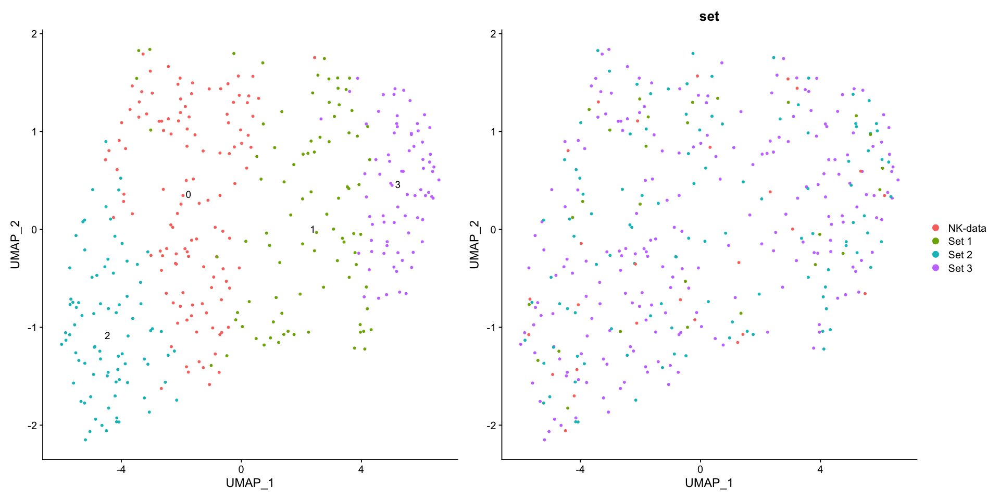

In [77]:
seu.meso.ps14 <- func.subclustering(seu.meso.ps14, resolution = 1.3)

In [78]:
levels(seu.meso.ps14) <- c(2,0,1,3)
all.markers <- FindAllMarkers(object = seu.meso.ps14, only.pos = TRUE)
nrow(all.markers)
all.markers.top10 <- all.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(all.markers.top10)

Calculating cluster 2

Calculating cluster 0

Calculating cluster 1

Calculating cluster 3



[1] 384

[1] 37

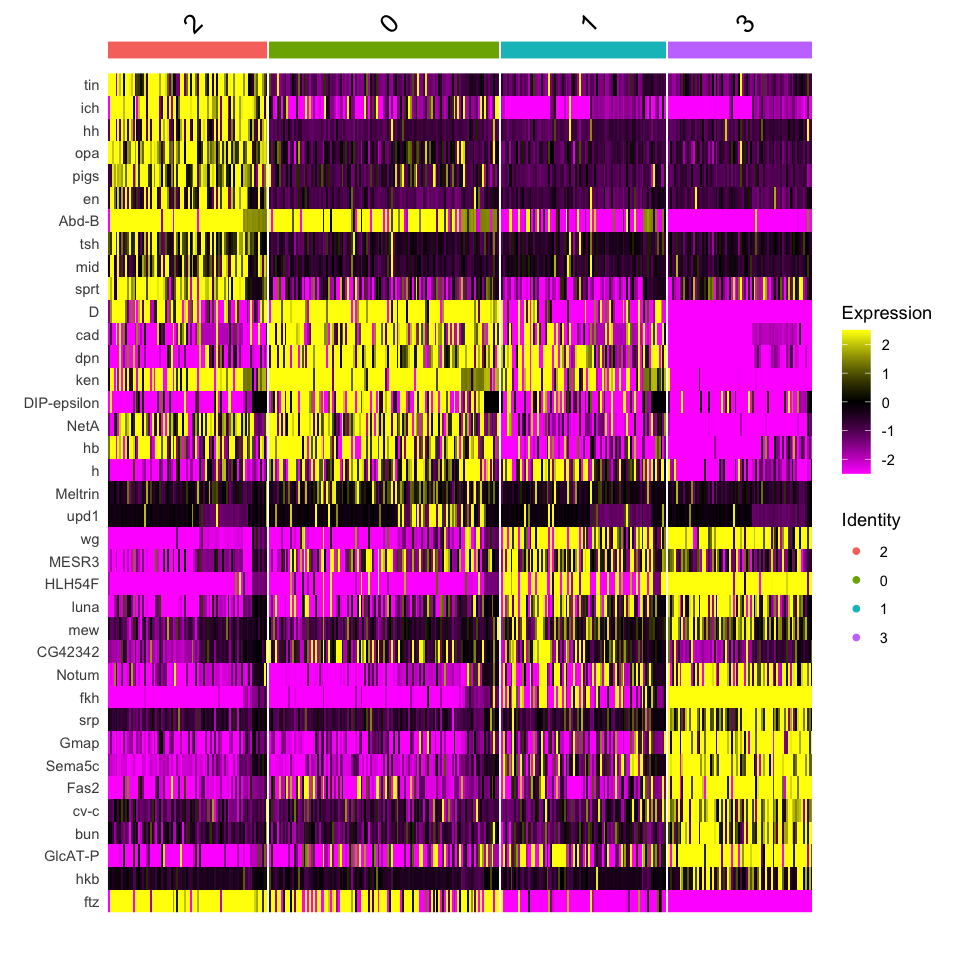

In [79]:
options(repr.plot.width=8, repr.plot.height=8)
DoHeatmap(seu.meso.ps14, features = c(all.markers.top10$gene,'ftz'))

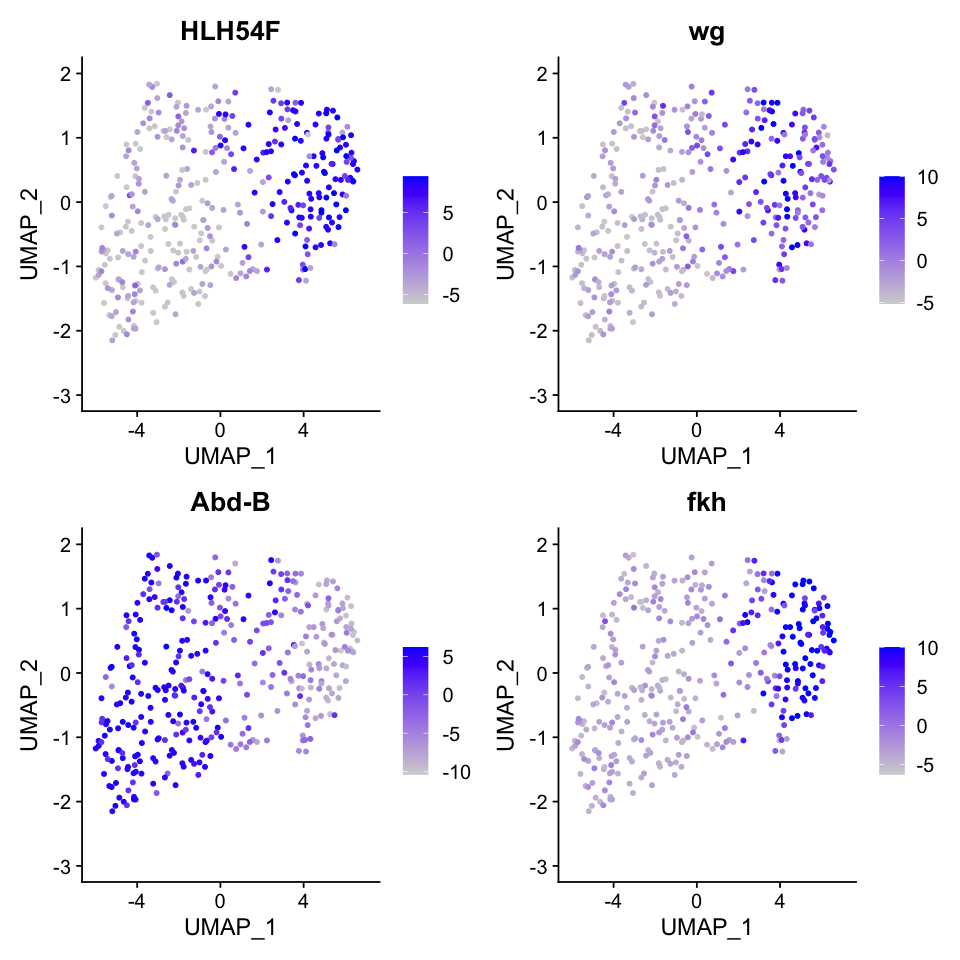

In [80]:
options(repr.plot.width=8, repr.plot.height=8)
FeaturePlot(seu.meso.ps14, reduction = 'umap', features = c('HLH54F', 'wg','Abd-B','fkh'), slot='scale.data')

### Add annotation

,manual_ID
,<fct>
Set3_AGCGTCGAGAGAGAAC,2
Set3_AAAGGATCAGGCACAA,0
Set3_AACACACAGGTCGCCT,1
Set3_AACACACGTGGCATCC,3
Set3_AACGAAAAGCCATTTG,3
Set3_AAGCGAGAGGAGCAAA,2


,manual_ID
,<fct>
Set3_AGCGTCGAGAGAGAAC,mesoderm_PS14
Set3_AAAGGATCAGGCACAA,mesoderm_PS14
Set3_AACACACAGGTCGCCT,mesoderm_PS14/mesoderm_caudal_visceral
Set3_AACACACGTGGCATCC,mesoderm_caudal_visceral
Set3_AACGAAAAGCCATTTG,mesoderm_caudal_visceral
Set3_AAGCGAGAGGAGCAAA,mesoderm_PS14


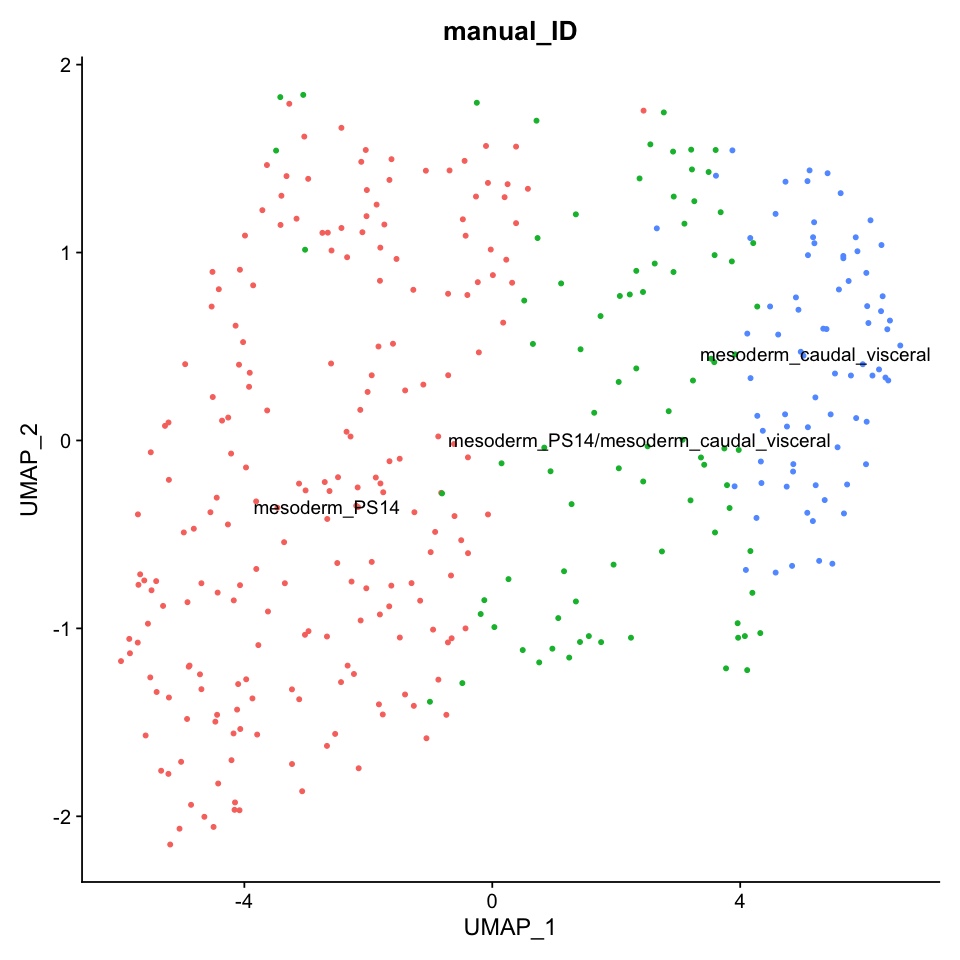

In [81]:
manual_id <- as.data.frame(seu.meso.ps14$seurat_clusters)
colnames(manual_id) <- c('manual_ID')
head(manual_id)
manual_id$manual_ID = dplyr::recode(manual_id$manual_ID, 
                                     "2"="mesoderm_PS14", #Abd-B+
                                     "0"="mesoderm_PS14", #Abd-B+
                                     "1"="mesoderm_PS14/mesoderm_caudal_visceral", #Abd-B+ HLH54F+
                                     "3"="mesoderm_caudal_visceral" #HLH54F+
                                   )
                                    

head(manual_id)
seu.meso.ps14$manual_ID <- manual_id
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu.meso.ps14, reduction = 'umap', label = T, group.by = 'manual_ID') + NoLegend() 

In [82]:
Idents(seu.meso.ps14) <- 'manual_ID'
levels(seu.meso.ps14) <- c('mesoderm_PS14','mesoderm_PS14/mesoderm_caudal_visceral','mesoderm_caudal_visceral')
all.markers <- FindAllMarkers(object = seu.meso.ps14, only.pos = TRUE)
nrow(all.markers)
all.markers.top10 <- all.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(all.markers.top10)

Calculating cluster mesoderm_PS14

Calculating cluster mesoderm_PS14/mesoderm_caudal_visceral

Calculating cluster mesoderm_caudal_visceral



[1] 314

[1] 27

Saving 7 x 7 in image



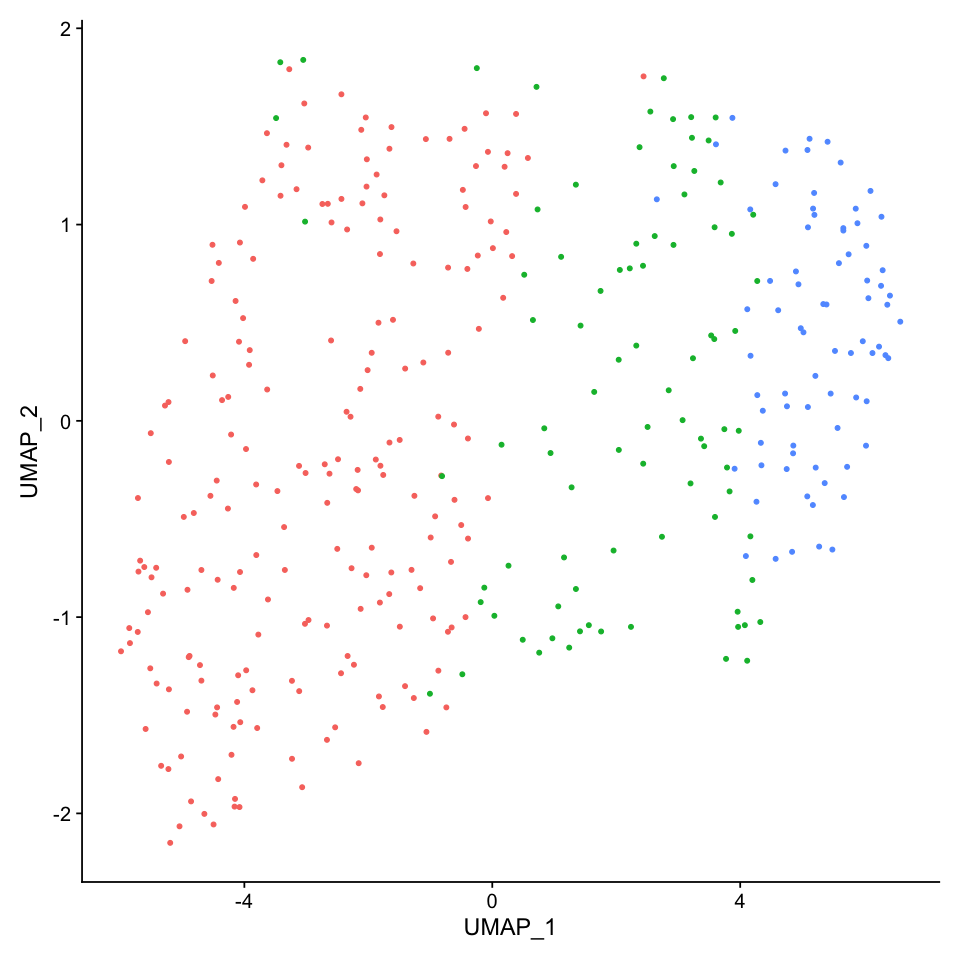

In [83]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu.meso.ps14, reduction =  "umap", label = FALSE) + NoLegend() 

fig
ggsave(fig, file = "./figures/04_meso_subclustering_integrate_all/meso_PS14_umap1.eps", dpi = 300)

Saving 7 x 7 in image



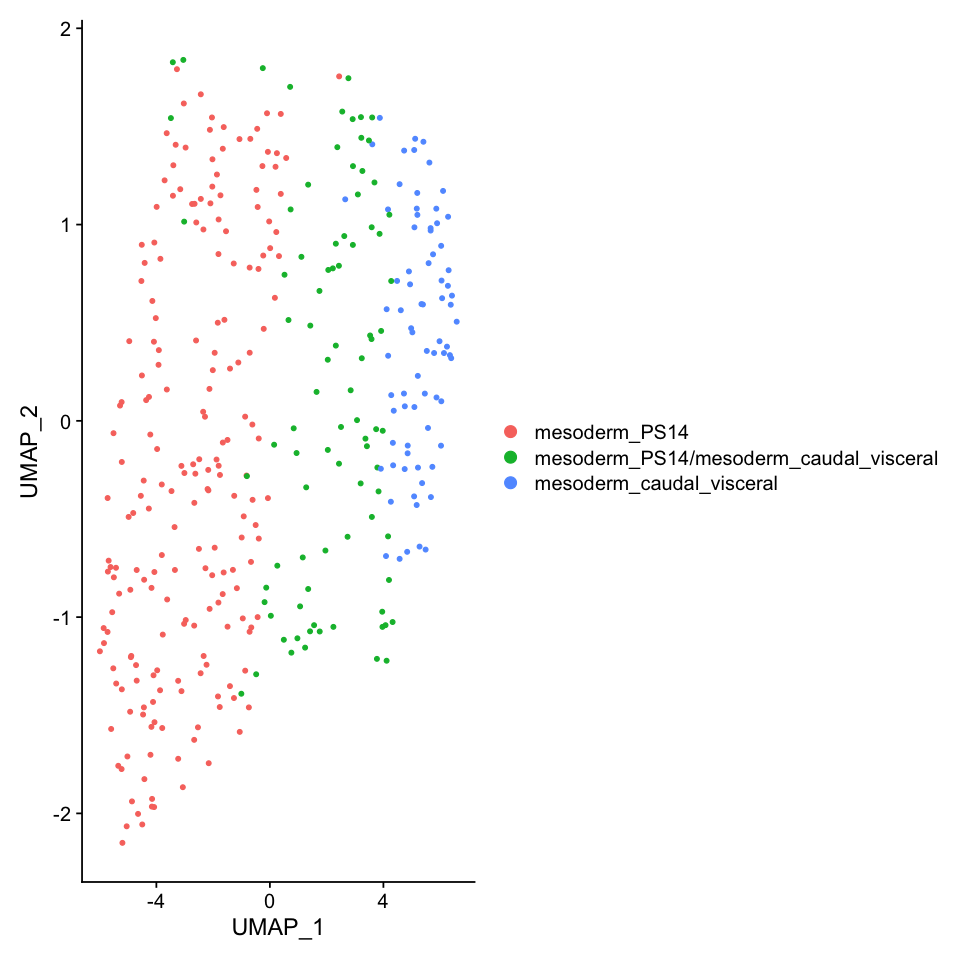

In [84]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DimPlot(seu.meso.ps14, reduction =  "umap", label = FALSE) 

fig
ggsave(fig, file = "./figures/04_meso_subclustering_integrate_all/meso_PS14_umap2.eps", dpi = 300)

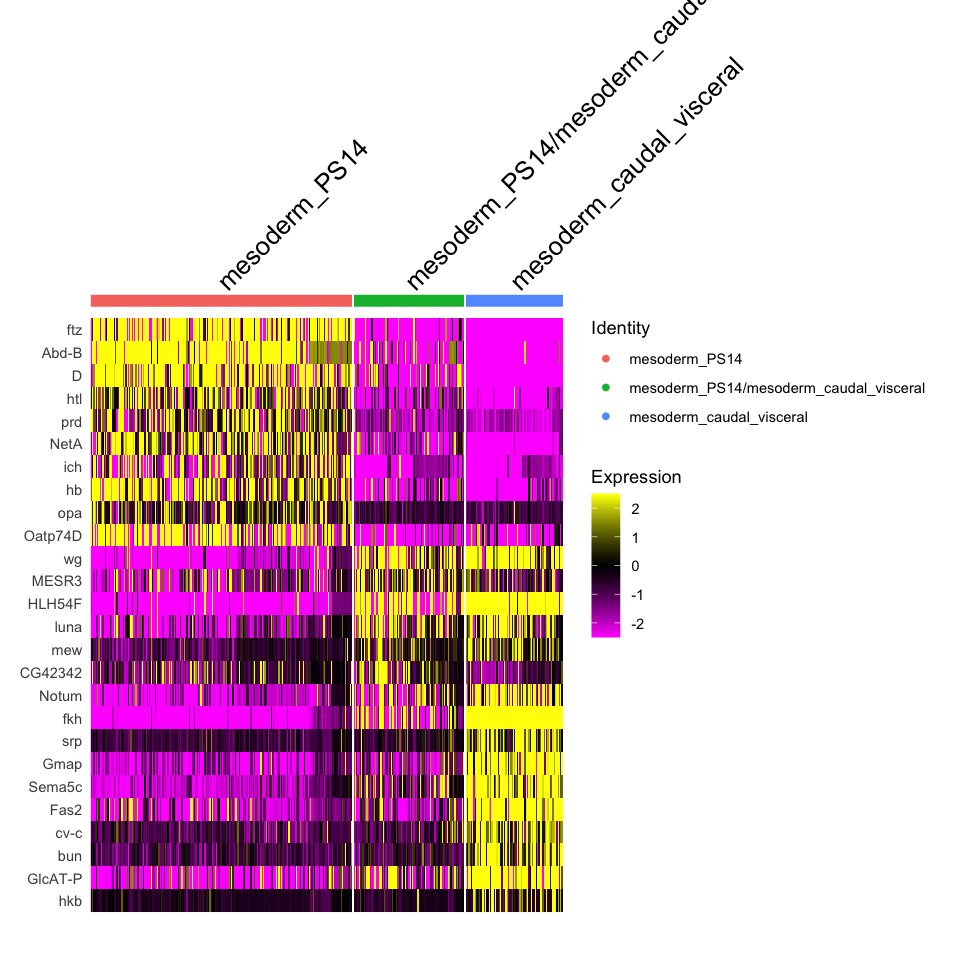

In [85]:
options(repr.plot.width=8, repr.plot.height=8)
fig <- DoHeatmap(seu.meso.ps14, features = c(all.markers.top10$gene))
fig
ggsave(fig, file = "./figures/04_meso_subclustering_integrate_all/meso_PS14_manualID_heatmap.eps", dpi = 300,  width = 12, height = 8)

In [86]:
seu.meso.merge <- merge(x = seu.ant, y =c(seu.meso.gcm,seu.meso.ps1to3,seu.trunk.meso,
                                                       seu.meso.ps13, seu.meso.ps14))
seu.others <- subset(seu_HQC, cells = colnames(seu.meso.merge), invert=TRUE)
seu.others$manual_ID <- 'others'
seu.result <- merge(x=seu.meso.merge, y=seu.others)
seu_HQC$manual_ID <- as.data.frame(seu.result$manual_ID)

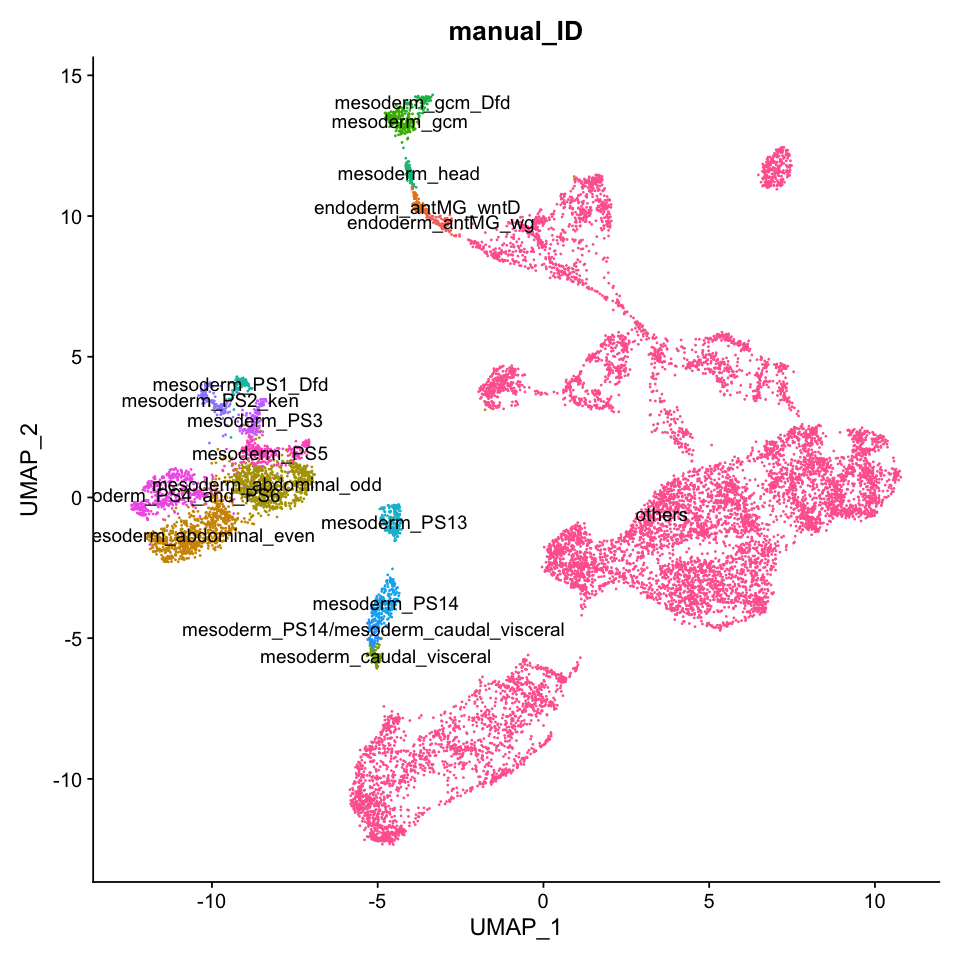

In [87]:
options(repr.plot.width=8, repr.plot.height=8)
DimPlot(seu_HQC, reduction =  "umap", label = TRUE, group.by = 'manual_ID') + NoLegend()

In [88]:
saveRDS(object = seu.meso.merge, file = '../../data/seurat_object/all_integration/subclustering/seu_meso_subclustering.obj')